<a href="https://colab.research.google.com/github/minoxd/fiber_optic_box_inspection/blob/main/data_preparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Get dataset

In [ ]:
shutil.copytree(paths['dataset_dir'], local_paths['dataset_dir'], dirs_exist_ok=True)

PosixPath('/content/dataset_v2_ALL')

In [ ]:
with tarfile.open(paths['processed_dataset_compressed'], 'r:gz') as tar_file:
    tar_file.extractall(local_paths['dataset_dir'])
    print(f"Extracted {paths['processed_dataset_compressed']} to {local_paths['dataset_dir']}")

Extracted /content/drive/MyDrive/fiber_optic_box_inspection/dataset_v2_ALL/processed_dataset.tar.gz to /content/dataset_v2_ALL


# install ultralytics

In [ ]:
!pip install ultralytics
from ultralytics import YOLO

  Using cached ultralytics-8.3.164-py3-none-any.whl.metadata (37 kB)
  Using cached ultralytics_thop-2.0.14-py3-none-any.whl.metadata (9.4 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-9.1.0.70-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.4.5.8-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.2.1.3-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.5.147-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.6.1.9-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.3.1.170-py3-none-manylinux2014_x86_64.whl.

# Environmental Setup

## mount gdrive, import libraries, declare constants, specify paths

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
from pathlib import Path
import shutil
import tarfile
import os
from sklearn.model_selection import train_test_split
import copy
from multiprocessing import Pool
import json
import yaml
import numpy as np
import cv2
import matplotlib.pyplot as plt
import albumentations as A
from google.colab.patches import cv2_imshow
import pandas as pd

if Path('/content/sample_data').exists():
    shutil.rmtree('/content/sample_data')

In [ ]:
IMGSZ = 960

These files are required in the `Data_INF` folder:
- data_label_All.tar.gz
- inf_raw_classes_v1.0.json
- matching_name_id_v1.0.xlsx

In [ ]:
BASE_DIR = '/content/drive/MyDrive/fiber_optic_box_inspection'
if not Path(BASE_DIR).exists():
    raise FileNotFoundError(f'Base directory {BASE_DIR} not found. Check Google Drive mount.')

LOCAL_BASE_DIR = '/content'

paths = {
    'base_dir':                                   Path(BASE_DIR),
    'Data_INF':                                   Path(BASE_DIR, 'Data_INF'),
    'dataset_dir':                                Path(BASE_DIR, 'dataset_v2_ALL'),
    # 'yolo_output_dir':                            Path(BASE_DIR, 'runs_yolo'),
}

if not paths['dataset_dir'].exists():
    Path.mkdir(paths['dataset_dir'])

paths['raw_classes'] =                            Path(paths['Data_INF'], 'inf_raw_classes_v1.0.json')
paths['new_raw_classes'] =                        Path(paths['Data_INF'], 'inf_raw_classes_v1.0_new.json')
paths['matching_name_id'] =                       Path(paths['Data_INF'], 'matching_name_id_v1.0.xlsx')
paths['dataset_compressed'] =                     Path(paths['Data_INF'], 'data_label_ALL.tar.gz')

paths['processed_dataset_compressed'] =           Path(paths['dataset_dir'], 'processed_dataset.tar.gz')

local_paths = {
    'base_dir':                                   Path(LOCAL_BASE_DIR),
    'dataset_dir':                                Path(LOCAL_BASE_DIR, 'dataset_v2_ALL'),
}

if not local_paths['dataset_dir'].exists():
    Path.mkdir(local_paths['dataset_dir'])

local_paths['image_label_dir'] =                  Path(local_paths['dataset_dir'], 'image_label')
local_paths['label_bbox_backup_dir'] =            Path(local_paths['dataset_dir'], 'label_bbox_backup')
local_paths['label_id_backup_dir'] =              Path(local_paths['dataset_dir'], 'label_id_backup')
local_paths['ids_from_label_files'] =             Path(local_paths['dataset_dir'], 'ids_from_label_files_backup_dir.txt')
local_paths['processed_dataset_compressed'] =     Path(local_paths['dataset_dir'], 'processed_dataset.tar.gz')

# local_paths['yolo_data_cfg'] =                    Path(local_paths['dataset_dir'], 'yolo_data_cfg.yaml')
# local_paths['train_paths'] =                      Path(local_paths['dataset_dir'], 'train.txt')
# local_paths['val_paths'] =                        Path(local_paths['dataset_dir'], 'val.txt')
# local_paths['test_paths'] =                       Path(local_paths['dataset_dir'], 'test.txt')


### percentile process paths

In [ ]:
#P00
local_paths['image_label_P00_dir'] =              Path(local_paths['dataset_dir'], 'image_label_P00')
local_paths['empty_data_P00_dir'] =               Path(local_paths['dataset_dir'], 'empty_data_P00')
local_paths['label_id_backup_P00_dir'] =          Path(local_paths['dataset_dir'], 'label_id_backup_P00')
local_paths['class_names_P00'] =                  Path(local_paths['dataset_dir'], 'class_names_P00.txt')
local_paths['all_paths_P00'] =                    Path(local_paths['dataset_dir'], 'all_P00.txt')
local_paths['train_paths_P00'] =                  Path(local_paths['dataset_dir'], 'train_P00.txt')
local_paths['val_paths_P00'] =                    Path(local_paths['dataset_dir'], 'val_P00.txt')
local_paths['test_paths_P00'] =                   Path(local_paths['dataset_dir'], 'test_P00.txt')
local_paths['yolo_data_cfg_P00'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P00.yaml')
#P25
local_paths['image_label_P25_dir'] =              Path(local_paths['dataset_dir'], 'image_label_P25')
local_paths['empty_data_P25_dir'] =               Path(local_paths['dataset_dir'], 'empty_data_P25')
local_paths['label_id_backup_P25_dir'] =          Path(local_paths['dataset_dir'], 'label_id_backup_P25')
local_paths['class_names_P25'] =                  Path(local_paths['dataset_dir'], 'class_names_P25.txt')
local_paths['all_paths_P25'] =                    Path(local_paths['dataset_dir'], 'all_P25.txt')
local_paths['train_paths_P25'] =                  Path(local_paths['dataset_dir'], 'train_P25.txt')
local_paths['val_paths_P25'] =                    Path(local_paths['dataset_dir'], 'val_P25.txt')
local_paths['test_paths_P25'] =                   Path(local_paths['dataset_dir'], 'test_P25.txt')
local_paths['yolo_data_cfg_P25'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P25.yaml')
#P30
local_paths['image_label_P30_dir'] =              Path(local_paths['dataset_dir'], 'image_label_P30')
local_paths['empty_data_P30_dir'] =               Path(local_paths['dataset_dir'], 'empty_data_P30')
local_paths['label_id_backup_P30_dir'] =          Path(local_paths['dataset_dir'], 'label_id_backup_P30')
local_paths['class_names_P30'] =                  Path(local_paths['dataset_dir'], 'class_names_P30.txt')
local_paths['all_paths_P30'] =                    Path(local_paths['dataset_dir'], 'all_P30.txt')
local_paths['train_paths_P30'] =                  Path(local_paths['dataset_dir'], 'train_P30.txt')
local_paths['val_paths_P30'] =                    Path(local_paths['dataset_dir'], 'val_P30.txt')
local_paths['test_paths_P30'] =                   Path(local_paths['dataset_dir'], 'test_P30.txt')
local_paths['yolo_data_cfg_P30'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P30.yaml')
#P35
local_paths['image_label_P35_dir'] =              Path(local_paths['dataset_dir'], 'image_label_P35')
local_paths['empty_data_P35_dir'] =               Path(local_paths['dataset_dir'], 'empty_data_P35')
local_paths['label_id_backup_P35_dir'] =          Path(local_paths['dataset_dir'], 'label_id_backup_P35')
local_paths['class_names_P35'] =                  Path(local_paths['dataset_dir'], 'class_names_P35.txt')
local_paths['all_paths_P35'] =                    Path(local_paths['dataset_dir'], 'all_P35.txt')
local_paths['train_paths_P35'] =                  Path(local_paths['dataset_dir'], 'train_P35.txt')
local_paths['val_paths_P35'] =                    Path(local_paths['dataset_dir'], 'val_P35.txt')
local_paths['test_paths_P35'] =                   Path(local_paths['dataset_dir'], 'test_P35.txt')
local_paths['yolo_data_cfg_P35'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P35.yaml')
#P40
local_paths['image_label_P40_dir'] =              Path(local_paths['dataset_dir'], 'image_label_P40')
local_paths['empty_data_P40_dir'] =               Path(local_paths['dataset_dir'], 'empty_data_P40')
local_paths['label_id_backup_P40_dir'] =          Path(local_paths['dataset_dir'], 'label_id_backup_P40')
local_paths['class_names_P40'] =                  Path(local_paths['dataset_dir'], 'class_names_P40.txt')
local_paths['all_paths_P40'] =                    Path(local_paths['dataset_dir'], 'all_P40.txt')
local_paths['train_paths_P40'] =                  Path(local_paths['dataset_dir'], 'train_P40.txt')
local_paths['val_paths_P40'] =                    Path(local_paths['dataset_dir'], 'val_P40.txt')
local_paths['test_paths_P40'] =                   Path(local_paths['dataset_dir'], 'test_P40.txt')
local_paths['yolo_data_cfg_P40'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40.yaml')
#P40 aug 1
local_paths['image_label_P40_aug_1_dir'] =        Path(local_paths['dataset_dir'], 'image_label_P40_aug_1')
local_paths['train_paths_P40_aug_1'] =            Path(local_paths['dataset_dir'], 'train_P40_aug_1.txt')
local_paths['yolo_data_cfg_P40_aug_1'] =          Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40_aug_1.yaml')
#P40 aug 2
local_paths['image_label_P40_aug_2_dir'] =        Path(local_paths['dataset_dir'], 'image_label_P40_aug_2')
local_paths['train_paths_P40_aug_2'] =            Path(local_paths['dataset_dir'], 'train_P40_aug_2.txt')
local_paths['yolo_data_cfg_P40_aug_2'] =          Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40_aug_2.yaml')
#P40 aug 3
local_paths['image_label_P40_aug_3_dir'] =        Path(local_paths['dataset_dir'], 'image_label_P40_aug_3')
local_paths['train_paths_P40_aug_3'] =            Path(local_paths['dataset_dir'], 'train_P40_aug_3.txt')
local_paths['yolo_data_cfg_P40_aug_3'] =          Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40_aug_3.yaml')
#P40 aug 4
local_paths['image_label_P40_aug_4_dir'] =        Path(local_paths['dataset_dir'], 'image_label_P40_aug_4')
local_paths['train_paths_P40_aug_4'] =            Path(local_paths['dataset_dir'], 'train_P40_aug_4.txt')
local_paths['yolo_data_cfg_P40_aug_4'] =          Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40_aug_4.yaml')

## utils

In [ ]:
def write_image_paths(paths, destination):
    with open(destination, 'w') as f:
        for path in paths:
            f.write(f'{path}\n')

In [ ]:
def read_image_paths(file_path):
    if Path(file_path).exists():
        with open(file_path, 'r') as f:
            return [Path(line.strip()) for line in f if line.strip()]
    return []

In [ ]:
def read_class_names(path: Path):
    with open(path, 'r') as f:
        class_names = [name.strip() for name in f.readlines()]
    return class_names

In [ ]:
def investigate_set(image_paths: Path, cls_ids):
    class_instance_dict = {i: [[], 0] for i in cls_ids}
    empty_label_list = []

    with open(image_paths, 'r') as f:
        paths = [path.strip() for path in f.readlines()]

    for path in paths:
        path = Path(path)
        image_id = path.stem
        with open(path.with_suffix('.txt'), 'r') as f:
            lines = f.readlines()

        if len(lines) == 0:
            empty_label_list.append(image_id)
            continue

        dictt = {}
        for line in lines:
            class_id = int(line.strip().split(' ')[0])
            if class_id not in dictt:
                dictt[class_id] = 0
            dictt[class_id] += 1

        for k, v in dictt.items():
            class_instance_dict[k][0].append(image_id)
            class_instance_dict[k][1] += v
    return class_instance_dict, empty_label_list

In [ ]:
def investigation_dict2df(investigate: dict):
    df_investigate = pd.DataFrame(
        data={k: [k, new_class_dict[str(k)], len(v[0]), v[1]] for k, v in investigate.items()}
    ).transpose().rename(columns={0: 'class_id', 1: 'class_name', 2: '# images', 3: '# instances'})
    print(len(df_investigate))
    df_investigate.sample(5)
    return df_investigate

# Data Preparation (Run once per lifetime)

## Extract compressed dataset to VM

The compressed dataset is located on GDrive. We extract the file directly from GDrive to VM's storage

In [ ]:
if not Path(local_paths['image_label_dir']).exists():
    Path.mkdir(local_paths['image_label_dir'])
shutil.rmtree(local_paths['image_label_dir'])

In [ ]:
with tarfile.open(paths['dataset_compressed'], 'r:gz') as tar_file:
    tar_file.extractall(local_paths['dataset_dir'])
print(f"Extracted {paths['dataset_compressed']} to {local_paths['dataset_dir']}")

Extracted /content/drive/MyDrive/fiber_optic_box_inspection/Data_INF/data_label_ALL.tar.gz to /content/dataset_v2_ALL


In [ ]:
p_old = Path(local_paths['dataset_dir'], 'data_label_v2_ALL')
p_new = Path(local_paths['image_label_dir'])
p_old.rename(p_new)
print(f"Renamed {p_old} to {p_new}")

Renamed /content/dataset_v2_ALL/data_label_v2_ALL to /content/dataset_v2_ALL/image_label


In [ ]:
for root, dirs, files in os.walk(local_paths['image_label_dir']):
    print(f"Total image and label files: {len(files)}")

Total image and label files: 22452


## Inspect class ids from label files and json
After this step, set of class ids from label files and set of class ids from json are the same (139 classes in total)

todo: functions in this section serve too many purposes, should refactor

### check bbox rounding error in label files

In [ ]:
def check_label_file(args):
    label_file, backup_dir = args
    filename = label_file.name
    try:
        with open(label_file, 'r') as f:
            lines = f.readlines()

        new_lines = copy.deepcopy(lines)
        indexes_of_change = set()
        for idx, line in enumerate(lines):
            parts = line.strip().split(' ')
            class_id = int(parts[0])
            (x_center, y_center, width, height) = map(float, parts[1:5])
            x_min, y_min, x_max, y_max = x_center - width/2, y_center - height/2, x_center + width/2, y_center + height/2
            new_x_center, new_y_center = x_center, y_center
            if x_min < 0.0:
                new_x_center = 0.0 + width/2
                indexes_of_change.add(idx)
            if y_min < 0.0:
                new_y_center = 0.0 + height/2
                indexes_of_change.add(idx)
            if x_max > 1.0:
                new_x_center = 1.0 - width/2
                indexes_of_change.add(idx)
            if y_max > 1.0:
                new_y_center = 1.0 - height/2
                indexes_of_change.add(idx)
            new_lines[idx] = f'{class_id} {new_x_center} {new_y_center} {width} {height}\n'

        if len(indexes_of_change) == 0:
            return

        backup_file = Path(backup_dir, filename)
        shutil.copy2(label_file, backup_file)
        with open(label_file, 'w') as f:
            f.writelines(new_lines)

        def show_changes(indexes, ls, new_ls):
            str_from = ''
            str_to = ''
            for idx in indexes:
                str_from += f'{ls[idx]}\n'
            for idx in indexes:
                str_to += f'{new_ls[idx]}\n'
            return f'from\n{str_from}to\n{str_to}'

        return f'Processed {filename}:\n{show_changes(indexes_of_change, lines, new_lines)}'
    except Exception as e:
        return f'Error processing {filename}: {e}'

def check_label_files(label_dir, backup_dir):

    all_labels = [Path(label_dir, f) for f in Path.iterdir(label_dir) if f.suffix == '.txt']

    args = [(f, backup_dir) for f in all_labels]

    with Pool() as pool:
        results = pool.map(check_label_file, args)

    for result in results:
        if result:
            print(result)

    return len(all_labels)

In [ ]:
if not Path(local_paths['label_bbox_backup_dir']).exists():
    Path.mkdir(local_paths['label_bbox_backup_dir'])

num_files_checked = check_label_files(
    label_dir=local_paths['image_label_dir'],
    backup_dir=local_paths['label_bbox_backup_dir'],
)

Processed 2022_11_08_09_56_54-HNIP446147HO.txt:
from
34 0.5399505766062604 0.8109530261969287 0.9200988467874794 0.055239385727190574

to
34 0.5399505766062602 0.8109530261969287 0.9200988467874794 0.055239385727190574


Processed 2022_12_08_16_10_56-HYNP002105HO.txt:
from
73 0.5173974741024551 0.5890698169433802 0.9652050517950902 0.8185185185185186

to
73 0.517397474102455 0.5890698169433802 0.9652050517950902 0.8185185185185186


Processed 2022_11_16_11_25_28-HGGP014132HO.txt:
from
36 0.6313395771250179 0.7602756492124308 0.7373208457499646 0.47944870157513836

to
36 0.6313395771250176 0.7602756492124308 0.7373208457499646 0.47944870157513836


Processed 2022_11_11_15_52_19-BTEP015147HO.txt:
from
137 0.5216191287072514 0.48101851851851846 0.9567617425854973 0.962037037037037

to
137 0.5216191287072514 0.4810185185185185 0.9567617425854973 0.962037037037037


Processed 2022_10_28_16_35_21-BTNP005155HO.txt:
from
137 0.38703703703703696 0.4362015751383568 0.774074074074074 0.7657407407

In [ ]:
print(f'Total files checked: {num_files_checked}')

Total files checked: 11226


### Get class ids from json

In [ ]:
with open(paths['raw_classes'], 'r') as f:
    class_dict = json.load(f)
print('Class dictionary from JSON:', class_dict)

class_ids_from_json = set(sorted([int(k) for k in class_dict.keys()]))

Class dictionary from JSON: {'0': '1.0', '1': '1.1', '2': '1.2', '4': '1.7', '7': '2.0', '8': '2.1', '9': '2.3', '10': '3.0', '11': '3.1', '12': '4.0', '13': '4.1', '14': '5.0', '15': '5.1', '16': '6.0', '17': '6.1', '18': '7.0', '19': '7.1', '20': '7.2', '21': '7.3', '23': '7.7', '24': '8.0', '25': '8.3', '27': '8.5', '28': '9.0', '30': '9.4', '32': '10.0', '33': '10.1', '34': '11.0', '35': '11.1', '36': '13.0', '37': '13.1', '38': '13.2', '41': '14.0', '42': '14.1', '43': '14.2', '44': '14.3', '45': '15.0', '46': '15.1', '47': '15.4', '50': '17.0', '51': '17.1', '52': '18.0', '53': '18.1', '54': '19.0', '55': '19.1', '56': '19.2', '57': '19.3', '58': '19.4', '59': '19.5', '60': '20.0', '61': '20.1', '62': '20.2', '63': '20.3', '67': '23.0', '68': '23.1', '69': '23.2', '70': '24.0', '71': '24.1', '72': '24.3', '73': '26.0', '74': '26.1', '75': '27.0', '76': '27.1', '77': '28.0', '78': '28.3', '80': '29.0', '81': '29.1', '82': '29.2', '83': '29.4', '84': '30.0', '85': '30.1', '86': '32

### Backup ids from label files before removal

In [ ]:
def get_class_ids_from_label_file(label_file):
    class_ids = set()
    msg = None
    try:
        ids = set()
        with open(label_file, 'r') as f:
            for line in f:
                if line.strip():
                    id = line.strip().split()[0]
                    ids.add(id)
        msg = f'Ids in {label_file}: {ids}'
        class_ids.update(ids)
    except Exception as e:
        msg = f'Error processing {label_file}: {e}'
    return class_ids, msg

def get_class_ids_from_label_files(label_dir):
    label_files = [Path(label_dir, f) for f in Path.iterdir(label_dir) if f.suffix == '.txt']
    with Pool() as pool:
        results = pool.map(get_class_ids_from_label_file, label_files)
    class_ids, msgs = zip(*results)
    class_ids = set().union(*class_ids)

    with open(local_paths['ids_from_label_files'], 'w') as f:
        f.write(str(len(msgs)) + '\n')
        for msg in msgs:
            f.write(f'{msg}\n')

    return set(sorted([int(id) for id in class_ids]))

In [ ]:
class_ids_from_label_files = get_class_ids_from_label_files(local_paths['image_label_dir'])

### Get class ids differences

In [ ]:
class_ids = class_ids_from_json & class_ids_from_label_files
class_ids_from_label_files_not_in_json = class_ids_from_label_files - class_ids
class_ids_from_json_not_in_label_files = class_ids_from_json - class_ids

In [ ]:
print(f'Class IDs from json (count: {len(class_ids_from_json)}):                                          \n\t {class_ids_from_json}')
print(f'Class IDs from label files (count: {len(class_ids_from_label_files)}):                            \n\t {class_ids_from_label_files}')
print(f'Class Ids from label files but not in json (count: {len(class_ids_from_label_files_not_in_json)}):\n\t {class_ids_from_label_files_not_in_json}')
print(f'Class Ids from json but not in label files (count: {len(class_ids_from_json_not_in_label_files)}):\n\t {class_ids_from_json_not_in_label_files}')
print(f'Class Ids (count: {len(class_ids)}):                                                              \n\t {class_ids}')

Class IDs from json (count: 151):                                          
	 {0, 1, 2, 4, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 27, 28, 30, 32, 33, 34, 35, 36, 37, 38, 41, 42, 43, 44, 45, 46, 47, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 80, 81, 82, 83, 84, 85, 86, 87, 88, 93, 94, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172}
Class IDs from label files (count: 150):                            
	 {0, 1, 2, 3, 4, 7, 9, 10, 11, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 54, 55, 56, 57, 58, 60, 61, 62, 63,

### From label files, remove labels that their ids does not appear in json

In [ ]:
def process_label_file(args):
    label_file, backup_dir, class_ids_to_remove = args
    label_file = Path(label_file)
    filename = label_file.name
    try:
        with open(label_file, 'r') as f:
            lines = f.readlines()

        lines_kept = [
            line for line in lines
            if line.strip() and line.strip().split()[0] not in class_ids_to_remove
        ]

        lines_removed = len(lines) - len(lines_kept)

        if lines_removed <= 0:
            return

        backup_file = Path(backup_dir, filename)
        shutil.copy2(label_file, backup_file)
        with open(label_file, 'w') as f:
            f.writelines(lines_kept)

        return f'Processed {filename}: {lines_removed} lines removed, original backed up'
    except Exception as e:
        return f'Error processing {filename}: {e}'

def process_label_files(label_dir, backup_dir, class_ids_to_remove):
    class_ids_to_remove = [str(id) for id in class_ids_to_remove]

    all_labels = [Path(label_dir, f) for f in Path.iterdir(label_dir) if f.suffix == '.txt']

    args = [(f, backup_dir, class_ids_to_remove) for f in all_labels]

    with Pool() as pool:
        results = pool.map(process_label_file, args)

    for result in results:
        if result:
            print(result)

    return len(all_labels)

In [ ]:
if not Path(local_paths['label_id_backup_dir']).exists():
    Path.mkdir(local_paths['label_id_backup_dir'])

num_files_processed = process_label_files(
    label_dir=local_paths['image_label_dir'],
    backup_dir=local_paths['label_id_backup_dir'],
    class_ids_to_remove=class_ids_from_label_files_not_in_json
)

Processed 2022_11_02_14_43_12-GLIP032281HO.txt: 1 lines removed, original backed up
Processed 2022_11_02_09_17_12-YBIP012112HO.txt: 1 lines removed, original backed up
Processed 2022_11_19_15_25_54-DNGP128207HO.txt: 1 lines removed, original backed up
Processed 2022_11_15_10_49_47-HNIP163139HO.txt: 1 lines removed, original backed up
Processed 2022_11_16_15_16_02-BPCP002389HO.txt: 1 lines removed, original backed up
Processed 2022_11_19_10_42_11-DNGP128193HO.txt: 1 lines removed, original backed up
Processed 2022_11_14_10_23_55-KTMP021124HO.txt: 1 lines removed, original backed up
Processed 2022_11_15_10_24_47-LANP012412HO.txt: 1 lines removed, original backed up
Processed 2022_11_01_14_08_02-DLKP035001HO.txt: 1 lines removed, original backed up
Processed 2022_11_12_15_53_59-GLIP015218HO.txt: 1 lines removed, original backed up
Processed 2022_11_15_11_53_26-AGGP053177HO.txt: 1 lines removed, original backed up
Processed 2022_11_19_15_16_19-DNGP128206HO.txt: 1 lines removed, original ba

In [ ]:
print(f'Total files processed: {num_files_processed}')

Total files processed: 11226


### From json, remove ids that are not in label files, then save to a new json

In [ ]:
with open(paths['raw_classes'], 'r') as f:
    new_class_dict = json.load(f)

for id in class_ids_from_json_not_in_label_files:
    new_class_dict.pop(str(id))
try:
    with open(paths['new_raw_classes'], 'w') as f:
        json.dump(new_class_dict, f, indent=2)
    print(f"JSON file created: {paths['new_raw_classes']}")
except Exception as e:
    print(f'Error writing JSON file: {e}')

JSON file created: /content/drive/MyDrive/fiber_optic_box_inspection/Data_INF/inf_raw_classes_v1.0_new.json


# Class Reduction

## drop P00

In [ ]:
shutil.copytree(local_paths['image_label_dir'], local_paths['image_label_P00_dir'])

PosixPath('/content/dataset_v2_ALL/image_label_P00')

### investigate dataset

In [ ]:
#before remove
all_images_P00 = sorted([Path(local_paths['image_label_P00_dir'], f) for f in Path.iterdir(local_paths['image_label_P00_dir']) if f.suffix == '.jpg'])
print(len(all_images_P00))
write_image_paths(all_images_P00, local_paths['all_paths_P00'])

11226


In [ ]:
class_ids_P00 = class_ids.copy()
investigate_all_P00, empty_label_list_P00 = investigate_set(local_paths['all_paths_P00'], class_ids_P00)
print(len(investigate_all_P00))
print(f'after investigation, there are {len(empty_label_list_P00)} data with no labels')

139
after investigation, there are 670 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P00_dir']).exists():
    Path.mkdir(local_paths['empty_data_P00_dir'])
count = 0
for image_id in empty_label_list_P00:
    shutil.move(Path(local_paths['image_label_P00_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P00_dir'])
    shutil.move(Path(local_paths['image_label_P00_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P00_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 1340


In [ ]:
df_investigate_all_P00 = investigation_dict2df(investigate_all_P00)

139


In [ ]:
df_investigate_all_P00.to_csv('/content/dataset_v2_ALL/investigate_all_P00.csv')

In [ ]:
percentiles_image = np.percentile(df_investigate_all_P00['# images'], [25, 30, 35, 40, 45, 50])
print(percentiles_image)

percentiles_instance = np.percentile(df_investigate_all_P00['# instances'], [25, 30, 35, 40, 45, 50])
print(percentiles_instance)

[21.0 40.4 57.3 95.0 148.8 208.0]
[26.5 42.199999999999996 69.3 102.4 159.3 219.0]


/tmp/ipython-input-36-2777170904.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_investigate_all_P00 \


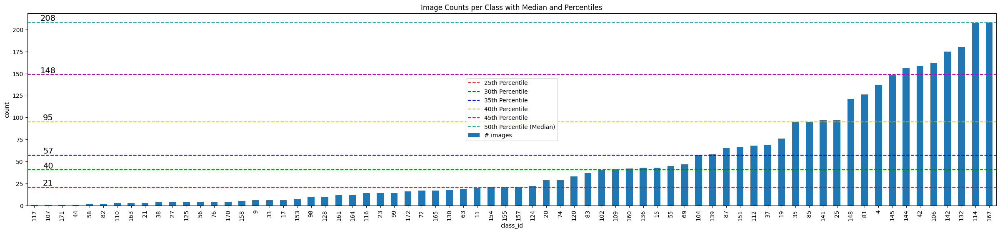

In [ ]:
df_investigate_all_P00 \
    .sort_values(by='# images')[(df_investigate_all_P00['# images'] <= percentiles_image[5])] \
    .plot.bar(y=['# images'], figsize=(30,6))
plt.axhline(y=percentiles_image[0], color='r', linestyle='--', label='25th Percentile')
plt.axhline(y=percentiles_image[1], color='g', linestyle='--', label='30th Percentile')
plt.axhline(y=percentiles_image[2], color='b', linestyle='--', label='35th Percentile')
plt.axhline(y=percentiles_image[3], color='y', linestyle='--', label='40th Percentile')
plt.axhline(y=percentiles_image[4], color='m', linestyle='--', label='45th Percentile')
plt.axhline(y=percentiles_image[5], color='c', linestyle='--', label='50th Percentile (Median)')
plt.title('Image Counts per Class with Median and Percentiles')
plt.legend()
for p in percentiles_image:
    plt.text(1, p, f'{int(p)}', va='bottom', ha='center', color='black', fontsize=14)
plt.xlabel('class_id')
plt.ylabel('count')
plt.show()

In [ ]:
df_investigate_all_P00

,class_id,class_name,# images,# instances
0,0,1.0,1013,1016
1,1,1.1,434,435
2,2,1.2,209,210
4,4,1.7,137,141
7,7,2.0,1792,1806
...,...,...,...,...
168,168,60.3,407,505
169,169,61.0,1871,1872
170,170,61.1,4,4
171,171,61.2,1,1


In [ ]:
# plt.boxplot([df_investigate_all_P00['# images'],
#              df_investigate_all_P25['# images'],
#              df_investigate_all_P30['# images'],
#              df_investigate_all_P35['# images'],
#              df_investigate_all_P40['# images']], labels=['# images', '# images', '# images', '# images', '# images'])
# plt.title('Box Plot Example')
# plt.ylabel('Values')
# plt.xlabel('Groups')
# plt.grid(True)
# plt.show()

In [ ]:
df_investigate_all_P00_drop = df_investigate_all_P00[
    (df_investigate_all_P00['# images'] <= 0) &
    (df_investigate_all_P00['# instances'] <= 0)
]
print(df_investigate_all_P00_drop.index)
print(len(df_investigate_all_P00_drop.index))

Index([], dtype='int64')
0


In [ ]:
df_investigate_all_P00_keep = df_investigate_all_P00[
    (df_investigate_all_P00['# images'] > 0) |
    (df_investigate_all_P00['# instances'] > 0)
]
print(df_investigate_all_P00_keep.index)
print(len(df_investigate_all_P00_keep.index))

Index([  0,   1,   2,   4,   7,   9,  10,  11,  14,  15,
       ...
       163, 164, 165, 166, 167, 168, 169, 170, 171, 172],
      dtype='int64', length=139)
139


In [ ]:
print(len(set(df_investigate_all_P00_keep.index).union(set(df_investigate_all_P00_keep.index))))

139


In [ ]:
investigate_all_P00_drop = {k: v for k, v in investigate_all_P00.items() if k not in df_investigate_all_P00_keep.index}
len(investigate_all_P00_drop)

0

In [ ]:
investigate_all_P00_keep = {k: v for k, v in investigate_all_P00.items() if k in df_investigate_all_P00_keep.index}
len(investigate_all_P00_keep)

139

### get class names

In [ ]:
class_ids_P00 = set(sorted(investigate_all_P00_keep.keys()))
print(len(class_ids_P00))

139


In [ ]:
class_names_P00 = [new_class_dict[str(id)] if id in class_ids_P00 else '' for id in range(list(class_ids_P00)[-1] + 1)]
print('Class names in order:', class_names_P00)
print(len([name for name in class_names_P00 if name != '']))

Class names in order: ['1.0', '1.1', '1.2', '', '1.7', '', '', '2.0', '', '2.3', '3.0', '3.1', '', '', '5.0', '5.1', '6.0', '6.1', '7.0', '7.1', '7.2', '7.3', '', '7.7', '8.0', '8.3', '', '8.5', '9.0', '', '9.4', '', '10.0', '10.1', '11.0', '11.1', '13.0', '13.1', '13.2', '', '', '14.0', '14.1', '14.2', '14.3', '', '', '', '', '', '', '', '', '', '19.0', '19.1', '19.2', '19.3', '19.4', '', '20.0', '20.1', '20.2', '20.3', '', '', '', '23.0', '23.1', '23.2', '24.0', '24.1', '24.3', '26.0', '26.1', '27.0', '27.1', '28.0', '', '', '29.0', '29.1', '29.2', '29.4', '30.0', '30.1', '32.0', '32.1', '32.2', '', '', '', '', '35.0', '35.1', '', '', '37.0', '37.1', '37.3', '37.4', '38.0', '38.1', '39.0', '39.1', '40.0', '40.1', '40.2', '41.0', '41.1', '41.2', '42.0', '42.1', '43.0', '43.1', '44.0', '44.1', '44.2', '45.0', '45.1', '45.2', '', '46.0', '46.1', '46.3', '46.4', '47.0', '47.1', '47.3', '48.0', '48.2', '49.0', '49.3', '49.4', '50.0', '50.1', '50.2', '51.0', '51.2', '51.3', '52.0', '52.3',

In [ ]:
with open(local_paths['class_names_P00'], 'w') as f:
    f.writelines([f'{name}\n' for name in class_names_P00])

### remove data

In [ ]:
if not Path(local_paths['label_id_backup_P00_dir']).exists():
    Path.mkdir(local_paths['label_id_backup_P00_dir'])

num_files_processed = process_label_files(
    label_dir=local_paths['image_label_P00_dir'],
    backup_dir=local_paths['label_id_backup_P00_dir'],
    class_ids_to_remove=set(df_investigate_all_P00_drop.index)
)
print(num_files_processed)

10556


In [ ]:
all_images_P00 = sorted([Path(local_paths['image_label_P00_dir'], f) for f in Path.iterdir(local_paths['image_label_P00_dir']) if f.suffix == '.jpg'])
print(len(all_images_P00))
write_image_paths(all_images_P00, local_paths['all_paths_P00'])

10556


In [ ]:
_, empty_label_list_P00 = investigate_set(local_paths['all_paths_P00'], class_ids_P00)

In [ ]:
print(f'after investigation, there are {len(empty_label_list_P00)} data with no labels')

after investigation, there are 0 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P00_dir']).exists():
    Path.mkdir(local_paths['empty_data_P00_dir'])
count = 0
for image_id in empty_label_list_P00:
    shutil.move(Path(local_paths['image_label_P00_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P00_dir'])
    shutil.move(Path(local_paths['image_label_P00_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P00_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 0


In [ ]:
all_images_P00 = sorted([Path(local_paths['image_label_P00_dir'], f) for f in Path.iterdir(local_paths['image_label_P00_dir']) if f.suffix == '.jpg'])
print(len(all_images_P00))
write_image_paths(all_images_P00, local_paths['all_paths_P00'])

10556


### Split dataset & save dataset division

In [ ]:
new_all_images_P00 = all_images_P00.copy()
train_images = []
val_images = []
test_images = []
for i in range(1000):
    for itrain in range(70):
        if len(new_all_images_P00) == 0:
            continue
        train_images.append(new_all_images_P00.pop(0))
    for ival in range(20):
        if len(new_all_images_P00) == 0:
            continue
        val_images.append(new_all_images_P00.pop(0))
    for itest in range(10):
        if len(new_all_images_P00) == 0:
            continue
        test_images.append(new_all_images_P00.pop(0))

In [ ]:
print(len(train_images))

7406


In [ ]:
write_image_paths(train_images, local_paths['train_paths_P00'])
write_image_paths(val_images, local_paths['val_paths_P00'])
write_image_paths(test_images, local_paths['test_paths_P00'])

In [ ]:
investigate_train_P00, _ = investigate_set(local_paths['train_paths_P00'], class_ids_P00)
investigate_val_P00, _ = investigate_set(local_paths['val_paths_P00'], class_ids_P00)
investigate_test_P00, _ = investigate_set(local_paths['test_paths_P00'], class_ids_P00)

In [ ]:
df_investigate_train_P00 = investigation_dict2df(investigate_train_P00)
df_investigate_val_P00 = investigation_dict2df(investigate_val_P00)
df_investigate_test_P00 = investigation_dict2df(investigate_test_P00)

139
139
139


In [ ]:
df_investigate_train_P00['set'] = 'train'
df_investigate_val_P00['set'] = 'val'
df_investigate_test_P00['set'] = 'test'

In [ ]:
df_investigate_split_P00 = pd.concat([df_investigate_train_P00, df_investigate_val_P00, df_investigate_test_P00], axis=0, ignore_index=True)
df_investigate_split_P00

,class_id,class_name,# images,# instances,set
0,0,1.0,706,707,train
1,1,1.1,304,305,train
2,2,1.2,147,147,train
3,4,1.7,91,95,train
4,7,2.0,1253,1265,train
...,...,...,...,...,...
412,168,60.3,44,52,test
413,169,61.0,174,174,test
414,170,61.1,0,0,test
415,171,61.2,0,0,test


In [ ]:
df_investigate_split_P00.to_csv('/content/dataset_v2_ALL/split_P00.csv')

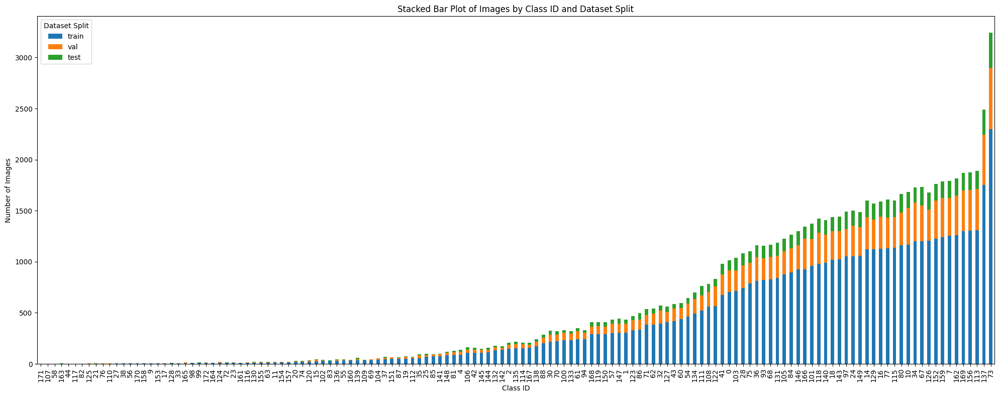

In [ ]:
df_pivot_images_P00 = df_investigate_split_P00.pivot_table(index='class_id', columns='set', values='# images')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_images_P00.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Images')
plt.title('Stacked Bar Plot of Images by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

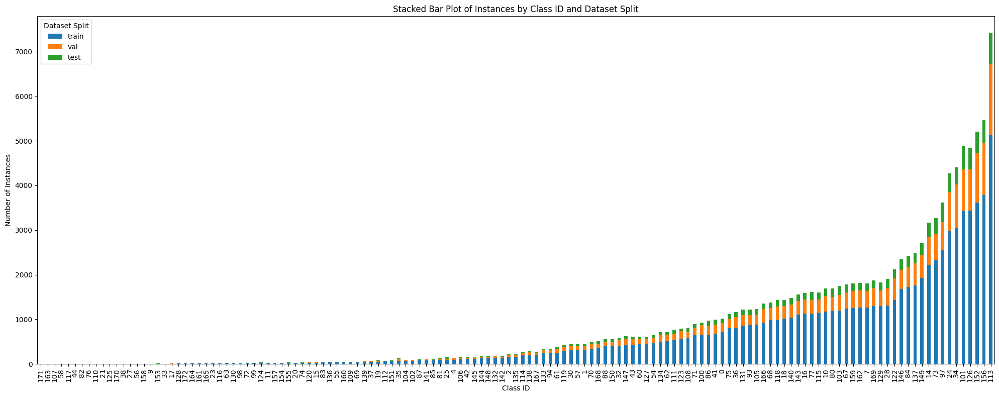

In [ ]:
df_pivot_instances_P00 = df_investigate_split_P00.pivot_table(index='class_id', columns='set', values='# instances')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_instances_P00.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Instances')
plt.title('Stacked Bar Plot of Instances by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

## drop P25

In [ ]:
shutil.copytree(local_paths['image_label_P00_dir'], local_paths['image_label_P25_dir'])

PosixPath('/content/dataset_v2_ALL/image_label_P25')

### investigate dataset

In [ ]:
#before remove
all_images_P25 = sorted([Path(local_paths['image_label_P25_dir'], f) for f in Path.iterdir(local_paths['image_label_P25_dir']) if f.suffix == '.jpg'])
print(len(all_images_P25))
write_image_paths(all_images_P25, local_paths['all_paths_P25'])

10556


In [ ]:
class_ids_P25 = class_ids_P00.copy()
investigate_all_P25, empty_label_list_P25 = investigate_set(local_paths['all_paths_P25'], class_ids_P25)
print(len(investigate_all_P25))
print(f'after investigation, there are {len(empty_label_list_P25)} data with no labels')

139
after investigation, there are 0 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P25_dir']).exists():
    Path.mkdir(local_paths['empty_data_P25_dir'])
count = 0
for image_id in empty_label_list_P25:
    shutil.move(Path(local_paths['image_label_P25_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P25_dir'])
    shutil.move(Path(local_paths['image_label_P25_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P25_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 0


In [ ]:
df_investigate_all_P25 = investigation_dict2df(investigate_all_P25)

139


In [ ]:
df_investigate_all_P25.to_csv('/content/dataset_v2_ALL/investigate_all_P25.csv')

/tmp/ipython-input-69-424982452.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_investigate_all_P00 \


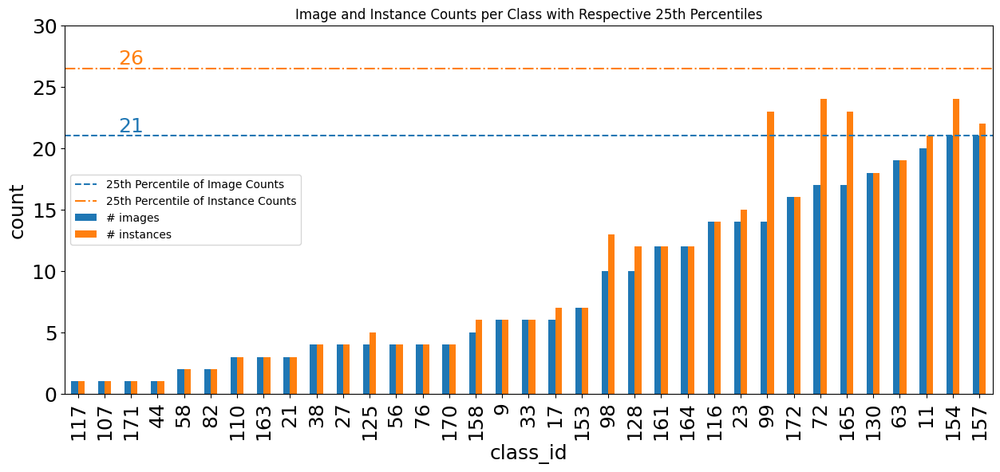

In [ ]:
df_investigate_all_P00 \
    .sort_values(by='# images')[
        (df_investigate_all_P00['# images'] <= percentiles_image[0]) &
         (df_investigate_all_P00['# instances'] <= percentiles_instance[0])] \
    .plot.bar(y=['# images', '# instances'], figsize=(15,6))
plt.axhline(y=percentiles_image[0], color='#1f77b4', linestyle='--', label='25th Percentile of Image Counts')
plt.axhline(y=percentiles_instance[0], color='#ff7f0e', linestyle='dashdot', label='25th Percentile of Instance Counts')
plt.text(2, percentiles_image[0], f'{int(percentiles_image[0])}', va='bottom', ha='center', color='#1f77b4', fontsize=18)
plt.text(2, percentiles_instance[0], f'{int(percentiles_instance[0])}', va='bottom', ha='center', color='#ff7f0e', fontsize=18)
plt.title('Image and Instance Counts per Class with Respective 25th Percentiles')
plt.legend()
plt.xlabel('class_id', fontsize=18)
plt.ylabel('count', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylim((0, 30))
plt.savefig(Path(paths['dataset_dir'], 'p25.png'), transparent=True)
plt.show()

In [ ]:
df_investigate_all_P25_drop = df_investigate_all_P25[
    (df_investigate_all_P25['# images'] <= percentiles_image[0]) &
    (df_investigate_all_P25['# instances'] <= percentiles_instance[0])
]
print(df_investigate_all_P25_drop.sort_values(by=['# images']).index)
print(len(df_investigate_all_P25_drop.index))

Index([107,  44, 117, 171,  58,  82, 163,  21, 110, 170,  27, 125,  38,  56,
        76, 158,   9,  17,  33, 153,  98, 128, 164, 161, 116,  99,  23, 172,
        72, 165, 130,  63,  11, 157, 154],
      dtype='int64')
35


In [ ]:
df_investigate_all_P25_keep = df_investigate_all_P25[
    (df_investigate_all_P25['# images'] > percentiles_image[0]) |
    (df_investigate_all_P25['# instances'] > percentiles_instance[0])
]
print(df_investigate_all_P25_keep.index)
print(len(df_investigate_all_P25_keep.index))

Index([  0,   1,   2,   4,   7,  10,  14,  15,  16,  18,
       ...
       152, 155, 156, 159, 160, 162, 166, 167, 168, 169],
      dtype='int64', length=104)
104


In [ ]:
print(len(set(df_investigate_all_P25_keep.index).union(set(df_investigate_all_P25_keep.index))))

104


In [ ]:
investigate_all_P25_drop = {k: v for k, v in investigate_all_P25.items() if k not in df_investigate_all_P25_keep.index}
len(investigate_all_P25_drop)

35

In [ ]:
investigate_all_P25_keep = {k: v for k, v in investigate_all_P25.items() if k in df_investigate_all_P25_keep.index}
len(investigate_all_P25_keep)

104

### get class names

In [ ]:
class_ids_P25 = set(sorted(investigate_all_P25_keep.keys()))
print(len(class_ids_P25))

104


In [ ]:
class_names_P25 = [new_class_dict[str(id)] if id in class_ids_P25 else '' for id in range(list(class_ids_P25)[-1] + 1)]
print('Class names in order:', class_names_P25)
print(len([name for name in class_names_P25 if name != '']))

Class names in order: ['1.0', '1.1', '1.2', '', '1.7', '', '', '2.0', '', '', '3.0', '', '', '', '5.0', '5.1', '6.0', '', '7.0', '7.1', '7.2', '', '', '', '8.0', '8.3', '', '', '9.0', '', '9.4', '', '10.0', '', '11.0', '11.1', '13.0', '13.1', '', '', '', '14.0', '14.1', '14.2', '', '', '', '', '', '', '', '', '', '', '19.0', '19.1', '', '19.3', '', '', '20.0', '20.1', '20.2', '', '', '', '', '23.0', '23.1', '23.2', '24.0', '24.1', '', '26.0', '26.1', '27.0', '', '28.0', '', '', '29.0', '29.1', '', '29.4', '30.0', '30.1', '32.0', '32.1', '32.2', '', '', '', '', '35.0', '35.1', '', '', '37.0', '', '', '37.4', '38.0', '38.1', '39.0', '39.1', '40.0', '40.1', '', '41.0', '41.1', '', '42.0', '42.1', '43.0', '43.1', '44.0', '', '', '45.0', '45.1', '45.2', '', '46.0', '46.1', '46.3', '', '47.0', '47.1', '', '48.0', '', '49.0', '49.3', '49.4', '50.0', '50.1', '50.2', '51.0', '51.2', '51.3', '52.0', '52.3', '52.5', '53.0', '53.4', '53.5', '54.0', '54.4', '54.5', '55.0', '55.4', '55.5', '56.0', '

In [ ]:
with open(local_paths['class_names_P25'], 'w') as f:
    f.writelines([f'{name}\n' for name in class_names_P25])

### remove data

In [ ]:
if not Path(local_paths['label_id_backup_P25_dir']).exists():
    Path.mkdir(local_paths['label_id_backup_P25_dir'])

num_files_processed = process_label_files(
    label_dir=local_paths['image_label_P25_dir'],
    backup_dir=local_paths['label_id_backup_P25_dir'],
    class_ids_to_remove=set(df_investigate_all_P25_drop.index)
)
print(num_files_processed)

Processed 2022_11_08_15_07_36-HNIP021027HO.txt: 1 lines removed, original backed up
Processed 2022_11_11_10_00_16-BRUP087026HO.txt: 1 lines removed, original backed up
Processed 2022_11_14_13_27_25-HDGP008124HO.txt: 1 lines removed, original backed up
Processed 2022_11_07_14_23_09-AGGP018108HO.txt: 1 lines removed, original backed up
Processed 2022_12_29_11_13_22-TNNP065167HO.txt: 2 lines removed, original backed up
Processed 2022_10_27_11_13_55-CMUP004065HO.txt: 1 lines removed, original backed up
Processed 2022_11_07_17_02_42-TNHP051144HO.txt: 1 lines removed, original backed up
Processed 2023_01_06_14_05_30-2023HO.txt: 1 lines removed, original backed up
Processed 2022_11_09_11_18_16-TNHP007248HO.txt: 1 lines removed, original backed up
Processed 2022_11_04_10_15_35-DLKP035122HO.txt: 1 lines removed, original backed up
Processed 2022_11_14_15_29_56-HNIP732373HO.txt: 1 lines removed, original backed up
Processed 2022_11_08_10_29_37-CMUP004283HO.txt: 1 lines removed, original backed u

In [ ]:
all_images_P25 = sorted([Path(local_paths['image_label_P25_dir'], f) for f in Path.iterdir(local_paths['image_label_P25_dir']) if f.suffix == '.jpg'])
print(len(all_images_P25))
write_image_paths(all_images_P25, local_paths['all_paths_P25'])

10556


In [ ]:
_, empty_label_list_P25 = investigate_set(local_paths['all_paths_P25'], class_ids_P25)

In [ ]:
print(f'after investigation, there are {len(empty_label_list_P25)} data with no labels')

after investigation, there are 1 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P25_dir']).exists():
    Path.mkdir(local_paths['empty_data_P25_dir'])
count = 0
for image_id in empty_label_list_P25:
    shutil.move(Path(local_paths['image_label_P25_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P25_dir'])
    shutil.move(Path(local_paths['image_label_P25_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P25_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 2


In [ ]:
all_images_P25 = sorted([Path(local_paths['image_label_P25_dir'], f) for f in Path.iterdir(local_paths['image_label_P25_dir']) if f.suffix == '.jpg'])
print(len(all_images_P25))
write_image_paths(all_images_P25, local_paths['all_paths_P25'])

10555


### Split dataset & save dataset division

In [ ]:
new_all_images_P25 = all_images_P25.copy()
train_images = []
val_images = []
test_images = []
for i in range(1000):
    for itrain in range(70):
        if len(new_all_images_P25) == 0:
            continue
        train_images.append(new_all_images_P25.pop(0))
    for ival in range(20):
        if len(new_all_images_P25) == 0:
            continue
        val_images.append(new_all_images_P25.pop(0))
    for itest in range(10):
        if len(new_all_images_P25) == 0:
            continue
        test_images.append(new_all_images_P25.pop(0))

In [ ]:
print(len(train_images))

7405


In [ ]:
write_image_paths(train_images, local_paths['train_paths_P25'])
write_image_paths(val_images, local_paths['val_paths_P25'])
write_image_paths(test_images, local_paths['test_paths_P25'])

In [ ]:
investigate_train_P25, _ = investigate_set(local_paths['train_paths_P25'], class_ids_P25)
investigate_val_P25, _ = investigate_set(local_paths['val_paths_P25'], class_ids_P25)
investigate_test_P25, _ = investigate_set(local_paths['test_paths_P25'], class_ids_P25)

In [ ]:
df_investigate_train_P25 = investigation_dict2df(investigate_train_P25)
df_investigate_val_P25 = investigation_dict2df(investigate_val_P25)
df_investigate_test_P25 = investigation_dict2df(investigate_test_P25)

104
104
104


In [ ]:
df_investigate_train_P25['set'] = 'train'
df_investigate_val_P25['set'] = 'val'
df_investigate_test_P25['set'] = 'test'

In [ ]:
df_investigate_split_P25 = pd.concat([df_investigate_train_P25, df_investigate_val_P25, df_investigate_test_P25], axis=0, ignore_index=True)
df_investigate_split_P25

,class_id,class_name,# images,# instances,set
0,0,1.0,706,707,train
1,1,1.1,303,304,train
2,2,1.2,146,146,train
3,4,1.7,90,94,train
4,7,2.0,1252,1264,train
...,...,...,...,...,...
307,162,59.0,170,170,test
308,166,60.0,121,121,test
309,167,60.1,18,22,test
310,168,60.3,45,53,test


In [ ]:
df_investigate_split_P25.to_csv('/content/dataset_v2_ALL/split_P25.csv')

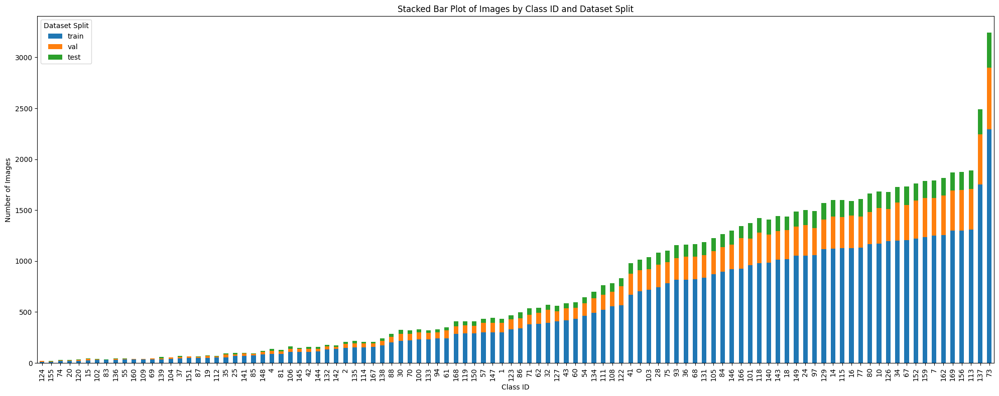

In [ ]:
df_pivot_images_P25 = df_investigate_split_P25.pivot_table(index='class_id', columns='set', values='# images')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_images_P25.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Images')
plt.title('Stacked Bar Plot of Images by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

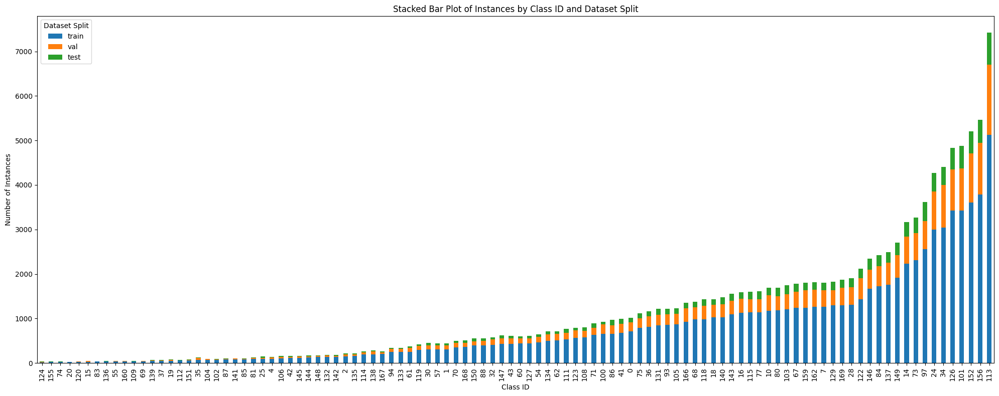

In [ ]:
df_pivot_instances_P25 = df_investigate_split_P25.pivot_table(index='class_id', columns='set', values='# instances')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_instances_P25.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Instances')
plt.title('Stacked Bar Plot of Instances by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

## drop P30

In [ ]:
shutil.copytree(local_paths['image_label_P25_dir'], local_paths['image_label_P30_dir'])

PosixPath('/content/dataset_v2_ALL/image_label_P30')

### investigate dataset

In [ ]:
#before remove
all_images_P30 = sorted([Path(local_paths['image_label_P30_dir'], f) for f in Path.iterdir(local_paths['image_label_P30_dir']) if f.suffix == '.jpg'])
print(len(all_images_P30))
write_image_paths(all_images_P30, local_paths['all_paths_P30'])

10555


In [ ]:
class_ids_P30 = class_ids_P25.copy()
investigate_all_P30, empty_label_list_P30 = investigate_set(local_paths['all_paths_P30'], class_ids_P30)
print(len(investigate_all_P30))
print(f'after investigation, there are {len(empty_label_list_P30)} data with no labels')

104
after investigation, there are 0 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P30_dir']).exists():
    Path.mkdir(local_paths['empty_data_P30_dir'])
count = 0
for image_id in empty_label_list_P30:
    shutil.move(Path(local_paths['image_label_P30_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P30_dir'])
    shutil.move(Path(local_paths['image_label_P30_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P30_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 0


In [ ]:
df_investigate_all_P30 = investigation_dict2df(investigate_all_P30)

104


In [ ]:
df_investigate_all_P30.to_csv('/content/dataset_v2_ALL/investigate_all_P30.csv')

/tmp/ipython-input-100-1601490143.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_investigate_all_P00 \


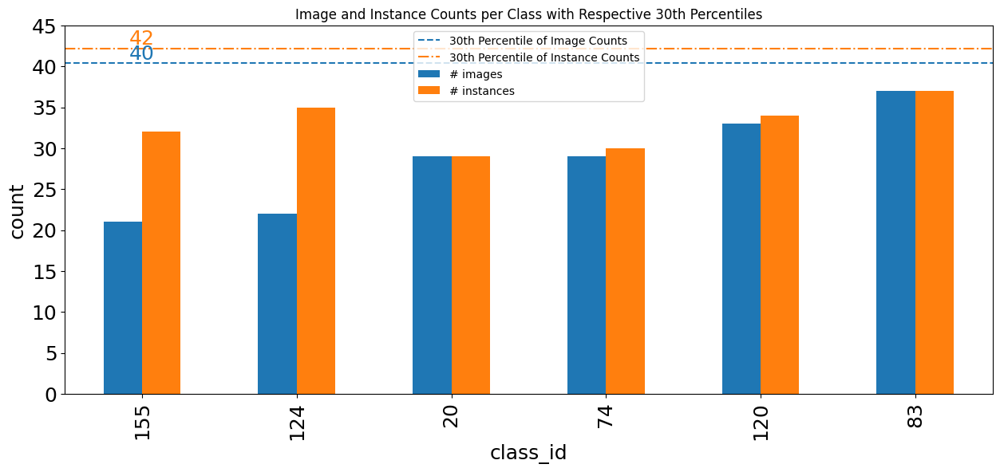

In [ ]:
df_investigate_all_P00 \
    .sort_values(by='# images')[
        ((df_investigate_all_P00['# images'] <= percentiles_image[1]) &
         (df_investigate_all_P00['# instances'] <= percentiles_instance[1])) &
        ((df_investigate_all_P00['# images'] > percentiles_image[0]) |
         (df_investigate_all_P00['# instances'] > percentiles_instance[0]))] \
    .plot.bar(y=['# images', '# instances'], figsize=(15,6))
plt.axhline(y=percentiles_image[1], color='#1f77b4', linestyle='--', label='30th Percentile of Image Counts')
plt.axhline(y=percentiles_instance[1], color='#ff7f0e', linestyle='dashdot', label='30th Percentile of Instance Counts')
plt.text(0, percentiles_image[1], f'{int(percentiles_image[1])}', va='bottom', ha='center', color='#1f77b4', fontsize=18)
plt.text(0, percentiles_instance[1], f'{int(percentiles_instance[1])}', va='bottom', ha='center', color='#ff7f0e', fontsize=18)
plt.title('Image and Instance Counts per Class with Respective 30th Percentiles')
plt.legend()
plt.xlabel('class_id', fontsize=18)
plt.ylabel('count', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylim((0, 45))
plt.savefig(Path(paths['dataset_dir'], 'p30.png'), transparent=True)
plt.show()

In [ ]:
df_investigate_all_P30_drop = df_investigate_all_P30[
    ((df_investigate_all_P30['# images'] <= percentiles_image[1]) &
    (df_investigate_all_P30['# instances'] <= percentiles_instance[1])) &
    ((df_investigate_all_P30['# images'] > percentiles_image[0]) |
    (df_investigate_all_P30['# instances'] > percentiles_instance[0]))
]
print(df_investigate_all_P30_drop.sort_values(by=['# images']).index)
print(len(df_investigate_all_P30_drop.index))

Index([155, 124, 20, 74, 120, 83], dtype='int64')
6


In [ ]:
df_investigate_all_P30_keep = df_investigate_all_P30[
    (df_investigate_all_P30['# images'] > percentiles_image[1]) |
    (df_investigate_all_P30['# instances'] > percentiles_instance[1])
]
print(df_investigate_all_P30_keep.index)
print(len(df_investigate_all_P30_keep.index))

Index([  0,   1,   2,   4,   7,  10,  14,  15,  16,  18,  19,  24,  25,  28,
        30,  32,  34,  35,  36,  37,  41,  42,  43,  54,  55,  57,  60,  61,
        62,  67,  68,  69,  70,  71,  73,  75,  77,  80,  81,  84,  85,  86,
        87,  88,  93,  94,  97, 100, 101, 102, 103, 104, 105, 106, 108, 109,
       111, 112, 113, 114, 115, 118, 119, 122, 123, 126, 127, 129, 131, 132,
       133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146,
       147, 148, 149, 150, 151, 152, 156, 159, 160, 162, 166, 167, 168, 169],
      dtype='int64')
98


In [ ]:
print(len(set(df_investigate_all_P30_keep.index).union(set(df_investigate_all_P30_keep.index))))

98


In [ ]:
investigate_all_P30_drop = {k: v for k, v in investigate_all_P30.items() if k not in df_investigate_all_P30_keep.index}
len(investigate_all_P30_drop)

6

In [ ]:
investigate_all_P30_keep = {k: v for k, v in investigate_all_P30.items() if k in df_investigate_all_P30_keep.index}
len(investigate_all_P30_keep)

98

### get class names

In [ ]:
class_ids_P30 = set(sorted(investigate_all_P30_keep.keys()))
print(len(class_ids_P30))

98


In [ ]:
class_names_P30 = [new_class_dict[str(id)] if id in class_ids_P30 else '' for id in range(list(class_ids_P30)[-1] + 1)]
print('Class names in order:', class_names_P30)
print(len([name for name in class_names_P30 if name != '']))

Class names in order: ['1.0', '1.1', '1.2', '', '1.7', '', '', '2.0', '', '', '3.0', '', '', '', '5.0', '5.1', '6.0', '', '7.0', '7.1', '', '', '', '', '8.0', '8.3', '', '', '9.0', '', '9.4', '', '10.0', '', '11.0', '11.1', '13.0', '13.1', '', '', '', '14.0', '14.1', '14.2', '', '', '', '', '', '', '', '', '', '', '19.0', '19.1', '', '19.3', '', '', '20.0', '20.1', '20.2', '', '', '', '', '23.0', '23.1', '23.2', '24.0', '24.1', '', '26.0', '', '27.0', '', '28.0', '', '', '29.0', '29.1', '', '', '30.0', '30.1', '32.0', '32.1', '32.2', '', '', '', '', '35.0', '35.1', '', '', '37.0', '', '', '37.4', '38.0', '38.1', '39.0', '39.1', '40.0', '40.1', '', '41.0', '41.1', '', '42.0', '42.1', '43.0', '43.1', '44.0', '', '', '45.0', '45.1', '', '', '46.0', '46.1', '', '', '47.0', '47.1', '', '48.0', '', '49.0', '49.3', '49.4', '50.0', '50.1', '50.2', '51.0', '51.2', '51.3', '52.0', '52.3', '52.5', '53.0', '53.4', '53.5', '54.0', '54.4', '54.5', '55.0', '55.4', '55.5', '56.0', '', '', '', '57.0', 

In [ ]:
with open(local_paths['class_names_P30'], 'w') as f:
    f.writelines([f'{name}\n' for name in class_names_P30])

### remove data

In [ ]:
if not Path(local_paths['label_id_backup_P30_dir']).exists():
    Path.mkdir(local_paths['label_id_backup_P30_dir'])

num_files_processed = process_label_files(
    label_dir=local_paths['image_label_P30_dir'],
    backup_dir=local_paths['label_id_backup_P30_dir'],
    class_ids_to_remove=set(df_investigate_all_P30_drop.index)
)
print(num_files_processed)

Processed 2022_11_14_10_40_30-HNIP535027HO.txt: 3 lines removed, original backed up
Processed 2022_11_10_11_29_37-QNIP019223HO.txt: 1 lines removed, original backed up
Processed 2022_11_04_10_50_38-HNIP534051HO.txt: 3 lines removed, original backed up
Processed 2022_11_09_16_16_04-HNIP212013HO.txt: 1 lines removed, original backed up
Processed 2022_12_26_11_51_11-DBNP006117HO.txt: 1 lines removed, original backed up
Processed 2022_10_28_10_27_03-KTMP019268HO.txt: 1 lines removed, original backed up
Processed 2022_11_14_11_01_01-GLIP025141HO.txt: 1 lines removed, original backed up
Processed 2022_11_16_09_10_00-HPGP066330HO.txt: 1 lines removed, original backed up
Processed 2022_12_02_17_08_08-TBHP023174HO.txt: 1 lines removed, original backed up
Processed 2022_11_15_09_56_25-HNIP550125HO.txt: 1 lines removed, original backed up
Processed 2022_11_17_09_47_08-HUEP002402HO.txt: 1 lines removed, original backed up
Processed 2022_12_07_11_38_52-CBGP007028HO.txt: 1 lines removed, original ba

In [ ]:
all_images_P30 = sorted([Path(local_paths['image_label_P30_dir'], f) for f in Path.iterdir(local_paths['image_label_P30_dir']) if f.suffix == '.jpg'])
print(len(all_images_P30))
write_image_paths(all_images_P30, local_paths['all_paths_P30'])

10555


In [ ]:
_, empty_label_list_P30 = investigate_set(local_paths['all_paths_P30'], class_ids_P30)

In [ ]:
print(f'after investigation, there are {len(empty_label_list_P30)} data with no labels')

after investigation, there are 1 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P00_dir']).exists():
    Path.mkdir(local_paths['empty_data_P30_dir'])
count = 0
for image_id in empty_label_list_P30:
    shutil.move(Path(local_paths['image_label_P30_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P30_dir'])
    shutil.move(Path(local_paths['image_label_P30_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P30_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 2


In [ ]:
all_images_P30 = sorted([Path(local_paths['image_label_P30_dir'], f) for f in Path.iterdir(local_paths['image_label_P30_dir']) if f.suffix == '.jpg'])
print(len(all_images_P30))
write_image_paths(all_images_P30, local_paths['all_paths_P30'])

10554


### Split dataset & save dataset division

In [ ]:
new_all_images_P30 = all_images_P30.copy()
train_images = []
val_images = []
test_images = []
for i in range(1000):
    for itrain in range(70):
        if len(new_all_images_P30) == 0:
            continue
        train_images.append(new_all_images_P30.pop(0))
    for ival in range(20):
        if len(new_all_images_P30) == 0:
            continue
        val_images.append(new_all_images_P30.pop(0))
    for itest in range(10):
        if len(new_all_images_P30) == 0:
            continue
        test_images.append(new_all_images_P30.pop(0))

In [ ]:
print(len(train_images))

7404


In [ ]:
write_image_paths(train_images, local_paths['train_paths_P30'])
write_image_paths(val_images, local_paths['val_paths_P30'])
write_image_paths(test_images, local_paths['test_paths_P30'])

In [ ]:
investigate_train_P30, _ = investigate_set(local_paths['train_paths_P30'], class_ids_P30)
investigate_val_P30, _ = investigate_set(local_paths['val_paths_P30'], class_ids_P30)
investigate_test_P30, _ = investigate_set(local_paths['test_paths_P30'], class_ids_P30)

In [ ]:
df_investigate_train_P30 = investigation_dict2df(investigate_train_P30)
df_investigate_val_P30 = investigation_dict2df(investigate_val_P30)
df_investigate_test_P30 = investigation_dict2df(investigate_test_P30)

98
98
98


In [ ]:
df_investigate_train_P30['set'] = 'train'
df_investigate_val_P30['set'] = 'val'
df_investigate_test_P30['set'] = 'test'

In [ ]:
df_investigate_split_P30 = pd.concat([df_investigate_train_P30, df_investigate_val_P30, df_investigate_test_P30], axis=0, ignore_index=True)
df_investigate_split_P30

,class_id,class_name,# images,# instances,set
0,0,1.0,713,714,train
1,1,1.1,302,303,train
2,2,1.2,146,146,train
3,4,1.7,88,92,train
4,7,2.0,1256,1268,train
...,...,...,...,...,...
289,162,59.0,175,175,test
290,166,60.0,123,124,test
291,167,60.1,21,25,test
292,168,60.3,46,52,test


In [ ]:
df_investigate_split_P30.to_csv('/content/dataset_v2_ALL/split_P30.csv')

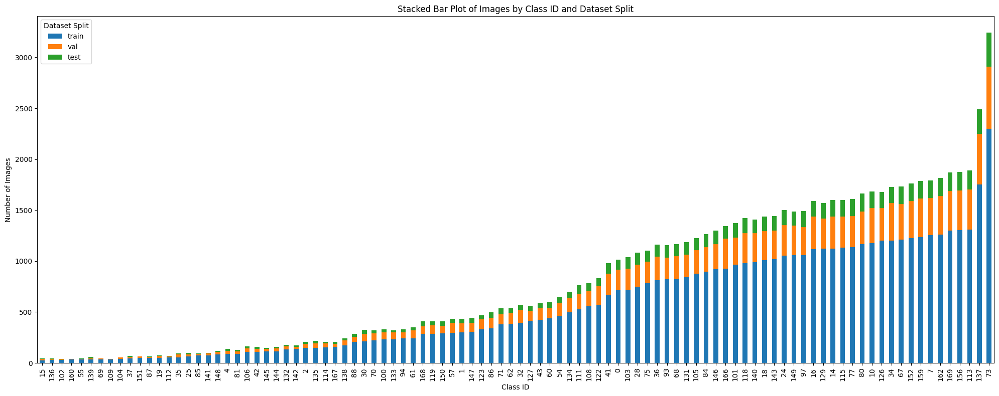

In [ ]:
df_pivot_images_P30 = df_investigate_split_P30.pivot_table(index='class_id', columns='set', values='# images')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_images_P30.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Images')
plt.title('Stacked Bar Plot of Images by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

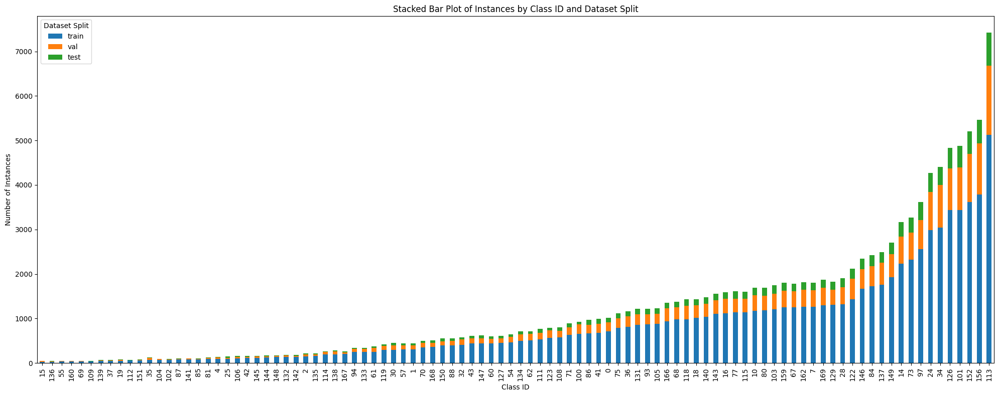

In [ ]:
df_pivot_instances_P30 = df_investigate_split_P30.pivot_table(index='class_id', columns='set', values='# instances')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_instances_P30.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Instances')
plt.title('Stacked Bar Plot of Instances by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

## drop P35

In [ ]:
shutil.copytree(local_paths['image_label_P30_dir'], local_paths['image_label_P35_dir'])

PosixPath('/content/dataset_v2_ALL/image_label_P35')

### investigate dataset

In [ ]:
#before remove
all_images_P35 = sorted([Path(local_paths['image_label_P35_dir'], f) for f in Path.iterdir(local_paths['image_label_P35_dir']) if f.suffix == '.jpg'])
print(len(all_images_P35))
write_image_paths(all_images_P35, local_paths['all_paths_P35'])

10554


In [ ]:
class_ids_P35 = class_ids_P30.copy()
investigate_all_P35, empty_label_list_P35 = investigate_set(local_paths['all_paths_P35'], class_ids_P35)
print(len(investigate_all_P35))
print(f'after investigation, there are {len(empty_label_list_P35)} data with no labels')

98
after investigation, there are 0 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P35_dir']).exists():
    Path.mkdir(local_paths['empty_data_P35_dir'])
count = 0
for image_id in empty_label_list_P35:
    shutil.move(Path(local_paths['image_label_P35_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P35_dir'])
    shutil.move(Path(local_paths['image_label_P35_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P35_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 0


In [ ]:
df_investigate_all_P35 = investigation_dict2df(investigate_all_P35)

98


In [ ]:
df_investigate_all_P35.to_csv('/content/dataset_v2_ALL/investigate_all_P35.csv')

/tmp/ipython-input-131-229777158.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_investigate_all_P00 \


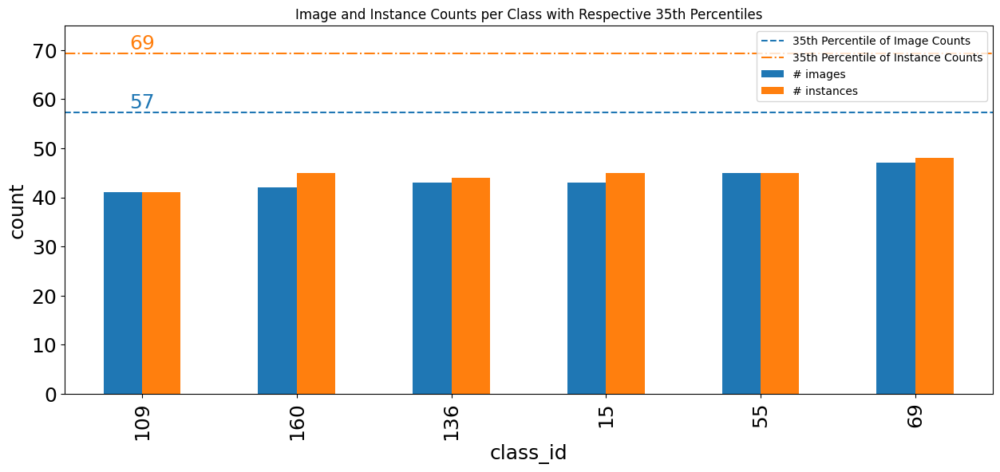

In [ ]:
df_investigate_all_P00 \
    .sort_values(by='# images')[
        ((df_investigate_all_P00['# images'] <= percentiles_image[2]) &
         (df_investigate_all_P00['# instances'] <= percentiles_instance[2])) &
        ((df_investigate_all_P00['# images'] > percentiles_image[1]) |
         (df_investigate_all_P00['# instances'] > percentiles_instance[1]))] \
    .plot.bar(y=['# images', '# instances'], figsize=(15,6))
plt.axhline(y=percentiles_image[2], color='#1f77b4', linestyle='--', label='35th Percentile of Image Counts')
plt.axhline(y=percentiles_instance[2], color='#ff7f0e', linestyle='dashdot', label='35th Percentile of Instance Counts')
plt.text(0, percentiles_image[2], f'{int(percentiles_image[2])}', va='bottom', ha='center', color='#1f77b4', fontsize=18)
plt.text(0, percentiles_instance[2], f'{int(percentiles_instance[2])}', va='bottom', ha='center', color='#ff7f0e', fontsize=18)
plt.title('Image and Instance Counts per Class with Respective 35th Percentiles')
plt.legend()
plt.xlabel('class_id', fontsize=18)
plt.ylabel('count', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylim((0, 75))
plt.savefig(Path(paths['dataset_dir'], 'p35.png'), transparent=True)
plt.show()

In [ ]:
df_investigate_all_P35_drop = df_investigate_all_P35[
    ((df_investigate_all_P35['# images'] <= percentiles_image[2]) &
    (df_investigate_all_P35['# instances'] <= percentiles_instance[2])) &
    ((df_investigate_all_P35['# images'] > percentiles_image[1]) |
    (df_investigate_all_P35['# instances'] > percentiles_instance[1]))
]
print(df_investigate_all_P35_drop.sort_values(by=['# images']).index)
print(len(df_investigate_all_P35_drop.index))

Index([109, 160, 15, 136, 55, 69], dtype='int64')
6


In [ ]:
df_investigate_all_P35_keep = df_investigate_all_P35[
    (df_investigate_all_P35['# images'] > percentiles_image[2]) |
    (df_investigate_all_P35['# instances'] > percentiles_instance[2])
]
print(df_investigate_all_P35_keep.index)
print(len(df_investigate_all_P35_keep.index))

Index([  0,   1,   2,   4,   7,  10,  14,  16,  18,  19,  24,  25,  28,  30,
        32,  34,  35,  36,  37,  41,  42,  43,  54,  57,  60,  61,  62,  67,
        68,  70,  71,  73,  75,  77,  80,  81,  84,  85,  86,  87,  88,  93,
        94,  97, 100, 101, 102, 103, 104, 105, 106, 108, 111, 112, 113, 114,
       115, 118, 119, 122, 123, 126, 127, 129, 131, 132, 133, 134, 135, 137,
       138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151,
       152, 156, 159, 162, 166, 167, 168, 169],
      dtype='int64')
92


In [ ]:
print(len(set(df_investigate_all_P35_keep.index).union(set(df_investigate_all_P35_keep.index))))

92


In [ ]:
investigate_all_P35_drop = {k: v for k, v in investigate_all_P35.items() if k not in df_investigate_all_P35_keep.index}
len(investigate_all_P35_drop)

6

In [ ]:
investigate_all_P35_keep = {k: v for k, v in investigate_all_P35.items() if k in df_investigate_all_P35_keep.index}
len(investigate_all_P35_keep)

92

### get class names

In [ ]:
class_ids_P35 = set(sorted(investigate_all_P35_keep.keys()))
print(len(class_ids_P35))

92


In [ ]:
class_names_P35 = [new_class_dict[str(id)] if id in class_ids_P35 else '' for id in range(list(class_ids_P35)[-1] + 1)]
print('Class names in order:', class_names_P35)
print(len([name for name in class_names_P35 if name != '']))

Class names in order: ['1.0', '1.1', '1.2', '', '1.7', '', '', '2.0', '', '', '3.0', '', '', '', '5.0', '', '6.0', '', '7.0', '7.1', '', '', '', '', '8.0', '8.3', '', '', '9.0', '', '9.4', '', '10.0', '', '11.0', '11.1', '13.0', '13.1', '', '', '', '14.0', '14.1', '14.2', '', '', '', '', '', '', '', '', '', '', '19.0', '', '', '19.3', '', '', '20.0', '20.1', '20.2', '', '', '', '', '23.0', '23.1', '', '24.0', '24.1', '', '26.0', '', '27.0', '', '28.0', '', '', '29.0', '29.1', '', '', '30.0', '30.1', '32.0', '32.1', '32.2', '', '', '', '', '35.0', '35.1', '', '', '37.0', '', '', '37.4', '38.0', '38.1', '39.0', '39.1', '40.0', '40.1', '', '41.0', '', '', '42.0', '42.1', '43.0', '43.1', '44.0', '', '', '45.0', '45.1', '', '', '46.0', '46.1', '', '', '47.0', '47.1', '', '48.0', '', '49.0', '49.3', '49.4', '50.0', '50.1', '', '51.0', '51.2', '51.3', '52.0', '52.3', '52.5', '53.0', '53.4', '53.5', '54.0', '54.4', '54.5', '55.0', '55.4', '55.5', '56.0', '', '', '', '57.0', '', '', '58.0', '',

In [ ]:
with open(local_paths['class_names_P35'], 'w') as f:
    f.writelines([f'{name}\n' for name in class_names_P35])

### remove data

In [ ]:
if not Path(local_paths['label_id_backup_P35_dir']).exists():
    Path.mkdir(local_paths['label_id_backup_P35_dir'])

num_files_processed = process_label_files(
    label_dir=local_paths['image_label_P35_dir'],
    backup_dir=local_paths['label_id_backup_P35_dir'],
    class_ids_to_remove=set(df_investigate_all_P35_drop.index)
)
print(num_files_processed)

Processed 2022_11_08_12_08_36-HNIP757053HO.txt: 1 lines removed, original backed up
Processed 2022_11_01_08_49_12-QNMP001128HO.txt: 1 lines removed, original backed up
Processed 2022_11_18_09_39_40-HDGP004057HO.txt: 1 lines removed, original backed up
Processed 2022_11_14_10_40_30-HNIP535027HO.txt: 1 lines removed, original backed up
Processed 2022_11_07_08_50_15-HNIP471206HO.txt: 1 lines removed, original backed up
Processed 2023_01_05_09_28_17-NBHP016202HO.txt: 1 lines removed, original backed up
Processed 2022_11_12_10_45_09-HNIP345065HO.txt: 1 lines removed, original backed up
Processed 2022_11_14_10_28_14-NTGP051183HO.txt: 1 lines removed, original backed up
Processed 2022_11_16_14_49_50-DNIP056387HO.txt: 1 lines removed, original backed up
Processed 2022_11_11_13_58_59-LDGP029028HO.txt: 1 lines removed, original backed up
Processed 2022_10_27_11_14_42-DNIP010476HO.txt: 1 lines removed, original backed up
Processed 2022_12_30_15_47_21-TNNP030055HO.txt: 1 lines removed, original ba

In [ ]:
all_images_P35 = sorted([Path(local_paths['image_label_P35_dir'], f) for f in Path.iterdir(local_paths['image_label_P35_dir']) if f.suffix == '.jpg'])
print(len(all_images_P35))
write_image_paths(all_images_P35, local_paths['all_paths_P35'])

10554


In [ ]:
_, empty_label_list_P35 = investigate_set(local_paths['all_paths_P35'], class_ids_P35)

In [ ]:
print(f'after investigation, there are {len(empty_label_list_P35)} data with no labels')

after investigation, there are 0 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P35_dir']).exists():
    Path.mkdir(local_paths['empty_data_P35_dir'])
count = 0
for image_id in empty_label_list_P35:
    shutil.move(Path(local_paths['image_label_P35_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P35_dir'])
    shutil.move(Path(local_paths['image_label_P35_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P35_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 0


In [ ]:
all_images_P35 = sorted([Path(local_paths['image_label_P35_dir'], f) for f in Path.iterdir(local_paths['image_label_P35_dir']) if f.suffix == '.jpg'])
print(len(all_images_P35))
write_image_paths(all_images_P35, local_paths['all_paths_P35'])

10554


### Split dataset & save dataset division

In [ ]:
new_all_images_P35 = all_images_P35.copy()
train_images = []
val_images = []
test_images = []
for i in range(1000):
    for itrain in range(70):
        if len(new_all_images_P35) == 0:
            continue
        train_images.append(new_all_images_P35.pop(0))
    for ival in range(20):
        if len(new_all_images_P35) == 0:
            continue
        val_images.append(new_all_images_P35.pop(0))
    for itest in range(10):
        if len(new_all_images_P35) == 0:
            continue
        test_images.append(new_all_images_P35.pop(0))

In [ ]:
print(len(train_images))

7404


In [ ]:
write_image_paths(train_images, local_paths['train_paths_P35'])
write_image_paths(val_images, local_paths['val_paths_P35'])
write_image_paths(test_images, local_paths['test_paths_P35'])

In [ ]:
investigate_train_P35, _ = investigate_set(local_paths['train_paths_P35'], class_ids_P35)
investigate_val_P35, _ = investigate_set(local_paths['val_paths_P35'], class_ids_P35)
investigate_test_P35, _ = investigate_set(local_paths['test_paths_P35'], class_ids_P35)

In [ ]:
df_investigate_train_P35 = investigation_dict2df(investigate_train_P35)
df_investigate_val_P35 = investigation_dict2df(investigate_val_P35)
df_investigate_test_P35 = investigation_dict2df(investigate_test_P35)

92
92
92


In [ ]:
df_investigate_train_P35['set'] = 'train'
df_investigate_val_P35['set'] = 'val'
df_investigate_test_P35['set'] = 'test'

In [ ]:
df_investigate_split_P35 = pd.concat([df_investigate_train_P35, df_investigate_val_P35, df_investigate_test_P35], axis=0, ignore_index=True)
df_investigate_split_P35

,class_id,class_name,# images,# instances,set
0,0,1.0,713,714,train
1,1,1.1,302,303,train
2,2,1.2,146,146,train
3,4,1.7,88,92,train
4,7,2.0,1256,1268,train
...,...,...,...,...,...
271,162,59.0,175,175,test
272,166,60.0,123,124,test
273,167,60.1,21,25,test
274,168,60.3,46,52,test


In [ ]:
df_investigate_split_P35.to_csv('/content/dataset_v2_ALL/split_P35.csv')

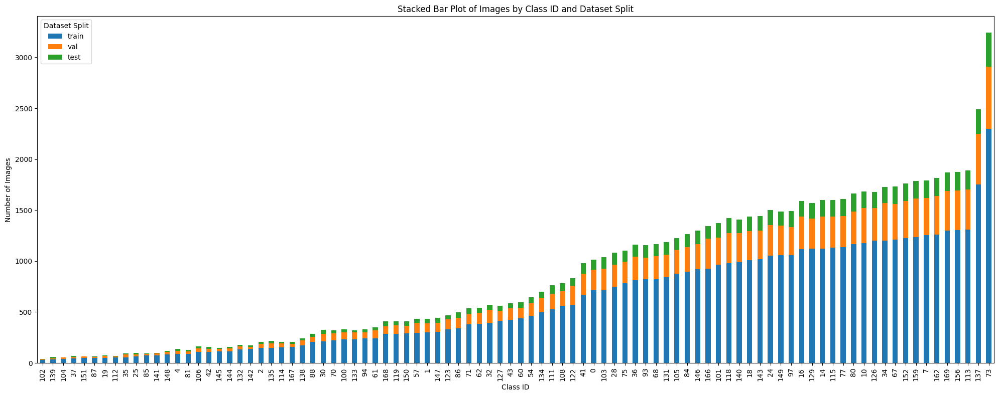

In [ ]:
df_pivot_images_P35 = df_investigate_split_P35.pivot_table(index='class_id', columns='set', values='# images')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_images_P35.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Images')
plt.title('Stacked Bar Plot of Images by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

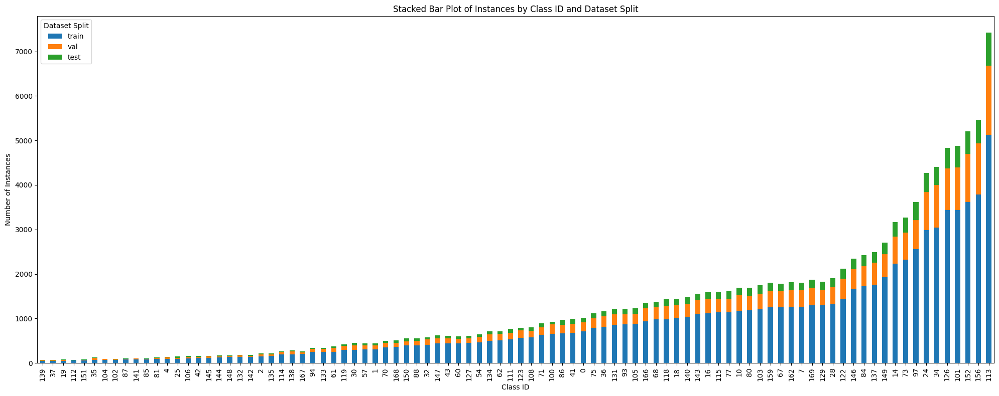

In [ ]:
df_pivot_instances_P35 = df_investigate_split_P35.pivot_table(index='class_id', columns='set', values='# instances')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_instances_P35.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Instances')
plt.title('Stacked Bar Plot of Instances by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

## drop P40

In [ ]:
shutil.copytree(local_paths['image_label_P35_dir'], local_paths['image_label_P40_dir'])

PosixPath('/content/dataset_v2_ALL/image_label_P40')

### investigate dataset

In [ ]:
#before remove
all_images_P40 = sorted([Path(local_paths['image_label_P40_dir'], f) for f in Path.iterdir(local_paths['image_label_P40_dir']) if f.suffix == '.jpg'])
print(len(all_images_P40))
write_image_paths(all_images_P40, local_paths['all_paths_P40'])

10554


In [ ]:
class_ids_P40 = class_ids_P35.copy()
investigate_all_P40, empty_label_list_P40 = investigate_set(local_paths['all_paths_P40'], class_ids_P40)
print(len(investigate_all_P40))
print(f'after investigation, there are {len(empty_label_list_P40)} data with no labels')

92
after investigation, there are 0 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P40_dir']).exists():
    Path.mkdir(local_paths['empty_data_P40_dir'])
count = 0
for image_id in empty_label_list_P40:
    shutil.move(Path(local_paths['image_label_P40_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P40_dir'])
    shutil.move(Path(local_paths['image_label_P40_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P40_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 0


In [ ]:
df_investigate_all_P40 = investigation_dict2df(investigate_all_P40)

92


In [ ]:
df_investigate_all_P40.to_csv('/content/dataset_v2_ALL/investigate_all_P40.csv')

/tmp/ipython-input-162-3263484340.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_investigate_all_P00 \


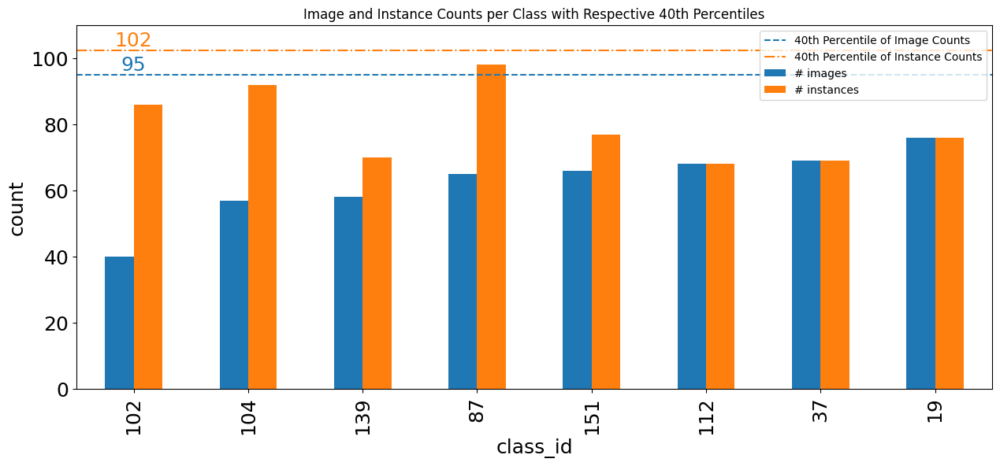

In [ ]:
df_investigate_all_P00 \
    .sort_values(by='# images')[
        ((df_investigate_all_P00['# images'] <= percentiles_image[3]) &
         (df_investigate_all_P00['# instances'] <= percentiles_instance[3])) &
        ((df_investigate_all_P00['# images'] > percentiles_image[2]) |
         (df_investigate_all_P00['# instances'] > percentiles_instance[2]))] \
    .plot.bar(y=['# images', '# instances'], figsize=(15,6))
plt.axhline(y=percentiles_image[3], color='#1f77b4', linestyle='--', label='40th Percentile of Image Counts')
plt.axhline(y=percentiles_instance[3], color='#ff7f0e', linestyle='dashdot', label='40th Percentile of Instance Counts')
plt.text(0, percentiles_image[3], f'{int(percentiles_image[3])}', va='bottom', ha='center', color='#1f77b4', fontsize=18)
plt.text(0, percentiles_instance[3], f'{int(percentiles_instance[3])}', va='bottom', ha='center', color='#ff7f0e', fontsize=18)
plt.title('Image and Instance Counts per Class with Respective 40th Percentiles')
plt.legend()
plt.xlabel('class_id', fontsize=18)
plt.ylabel('count', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylim((0, 110))
plt.savefig(Path(paths['dataset_dir'], 'p40.png'), transparent=True)
plt.show()

In [ ]:
df_investigate_all_P40_drop = df_investigate_all_P40[
    ((df_investigate_all_P40['# images'] <= percentiles_image[3]) &
    (df_investigate_all_P40['# instances'] <= percentiles_instance[3])) &
    ((df_investigate_all_P40['# images'] > percentiles_image[2]) |
    (df_investigate_all_P40['# instances'] > percentiles_instance[2]))
]
print(df_investigate_all_P40_drop.sort_values(by=['# images']).index)
print(len(df_investigate_all_P40_drop.index))

Index([102, 104, 139, 87, 151, 112, 37, 19], dtype='int64')
8


In [ ]:
df_investigate_all_P40_keep = df_investigate_all_P40[
    (df_investigate_all_P40['# images'] > percentiles_image[3]) |
    (df_investigate_all_P40['# instances'] > percentiles_instance[3])
]
print(df_investigate_all_P40_keep.index)
print(len(df_investigate_all_P40_keep.index))

Index([  0,   1,   2,   4,   7,  10,  14,  16,  18,  24,  25,  28,  30,  32,
        34,  35,  36,  41,  42,  43,  54,  57,  60,  61,  62,  67,  68,  70,
        71,  73,  75,  77,  80,  81,  84,  85,  86,  88,  93,  94,  97, 100,
       101, 103, 105, 106, 108, 111, 113, 114, 115, 118, 119, 122, 123, 126,
       127, 129, 131, 132, 133, 134, 135, 137, 138, 140, 141, 142, 143, 144,
       145, 146, 147, 148, 149, 150, 152, 156, 159, 162, 166, 167, 168, 169],
      dtype='int64')
84


In [ ]:
print(len(set(df_investigate_all_P40_keep.index).union(set(df_investigate_all_P40_keep.index))))

84


In [ ]:
investigate_all_P40_drop = {k: v for k, v in investigate_all_P40.items() if k not in df_investigate_all_P40_keep.index}
len(investigate_all_P40_drop)

8

In [ ]:
investigate_all_P40_keep = {k: v for k, v in investigate_all_P40.items() if k in df_investigate_all_P40_keep.index}
len(investigate_all_P40_keep)

84

### get class names

In [ ]:
class_ids_P40 = set(sorted(investigate_all_P40_keep.keys()))
print(len(class_ids_P40))

84


In [ ]:
class_names_P40 = [new_class_dict[str(id)] if id in class_ids_P40 else '' for id in range(list(class_ids_P40)[-1] + 1)]
print('Class names in order:', class_names_P40)
print(len([name for name in class_names_P40 if name != '']))

Class names in order: ['1.0', '1.1', '1.2', '', '1.7', '', '', '2.0', '', '', '3.0', '', '', '', '5.0', '', '6.0', '', '7.0', '', '', '', '', '', '8.0', '8.3', '', '', '9.0', '', '9.4', '', '10.0', '', '11.0', '11.1', '13.0', '', '', '', '', '14.0', '14.1', '14.2', '', '', '', '', '', '', '', '', '', '', '19.0', '', '', '19.3', '', '', '20.0', '20.1', '20.2', '', '', '', '', '23.0', '23.1', '', '24.0', '24.1', '', '26.0', '', '27.0', '', '28.0', '', '', '29.0', '29.1', '', '', '30.0', '30.1', '32.0', '', '32.2', '', '', '', '', '35.0', '35.1', '', '', '37.0', '', '', '37.4', '38.0', '', '39.0', '', '40.0', '40.1', '', '41.0', '', '', '42.0', '', '43.0', '43.1', '44.0', '', '', '45.0', '45.1', '', '', '46.0', '46.1', '', '', '47.0', '47.1', '', '48.0', '', '49.0', '49.3', '49.4', '50.0', '50.1', '', '51.0', '51.2', '', '52.0', '52.3', '52.5', '53.0', '53.4', '53.5', '54.0', '54.4', '54.5', '55.0', '55.4', '', '56.0', '', '', '', '57.0', '', '', '58.0', '', '', '59.0', '', '', '', '60.0'

In [ ]:
with open(local_paths['class_names_P40'], 'w') as f:
    f.writelines([f'{name}\n' for name in class_names_P40])

### remove data

In [ ]:
if not Path(local_paths['label_id_backup_P40_dir']).exists():
    Path.mkdir(local_paths['label_id_backup_P40_dir'])

num_files_processed = process_label_files(
    label_dir=local_paths['image_label_P40_dir'],
    backup_dir=local_paths['label_id_backup_P40_dir'],
    class_ids_to_remove=set(df_investigate_all_P40_drop.index)
)
print(num_files_processed)

Processed 2022_11_15_09_54_27-TGGP010319HO.txt: 1 lines removed, original backed up
Processed 2022_11_02_09_17_12-YBIP012112HO.txt: 1 lines removed, original backed up
Processed 2022_11_19_10_20_30-BPCP008028HO.txt: 1 lines removed, original backed up
Processed 2022_11_02_11_50_32-BDGP055681HO.txt: 1 lines removed, original backed up
Processed 2022_11_07_08_50_15-HNIP471206HO.txt: 3 lines removed, original backed up
Processed 2022_11_15_09_43_10-LANP029340HO.txt: 1 lines removed, original backed up
Processed 2022_11_02_10_44_24-DLKP035036HO.txt: 1 lines removed, original backed up
Processed 2022_11_10_15_38_20-HNIP041129HO.txt: 8 lines removed, original backed up
Processed 2022_11_03_10_23_06-BRUP002156HO.txt: 2 lines removed, original backed up
Processed 2022_11_17_10_34_25-HGGP004113HO.txt: 1 lines removed, original backed up
Processed 2022_11_09_09_41_33-HNIP390048HO.txt: 4 lines removed, original backed up
Processed 2022_11_08_16_12_05-HNIP757104HO.txt: 1 lines removed, original ba

In [ ]:
all_images_P40 = sorted([Path(local_paths['image_label_P40_dir'], f) for f in Path.iterdir(local_paths['image_label_P40_dir']) if f.suffix == '.jpg'])
print(len(all_images_P40))
write_image_paths(all_images_P40, local_paths['all_paths_P40'])

10554


In [ ]:
_, empty_label_list_P40 = investigate_set(local_paths['all_paths_P40'], class_ids_P40)

In [ ]:
print(f'after investigation, there are {len(empty_label_list_P40)} data with no labels')

after investigation, there are 1 data with no labels


In [ ]:
if not Path(local_paths['empty_data_P40_dir']).exists():
    Path.mkdir(local_paths['empty_data_P40_dir'])
count = 0
for image_id in empty_label_list_P40:
    shutil.move(Path(local_paths['image_label_P40_dir'], image_id).with_suffix('.jpg'), local_paths['empty_data_P40_dir'])
    shutil.move(Path(local_paths['image_label_P40_dir'], image_id).with_suffix('.txt'), local_paths['empty_data_P40_dir'])
    count += 1
print(f'file moved: {count*2}')

file moved: 2


In [ ]:
all_images_P40 = sorted([Path(local_paths['image_label_P40_dir'], f) for f in Path.iterdir(local_paths['image_label_P40_dir']) if f.suffix == '.jpg'])
print(len(all_images_P40))
write_image_paths(all_images_P40, local_paths['all_paths_P40'])

10553


### Split dataset & save dataset division

In [ ]:
new_all_images_P40 = all_images_P40.copy()
train_images = []
val_images = []
test_images = []
for i in range(1000):
    for itrain in range(70):
        if len(new_all_images_P40) == 0:
            continue
        train_images.append(new_all_images_P40.pop(0))
    for ival in range(20):
        if len(new_all_images_P40) == 0:
            continue
        val_images.append(new_all_images_P40.pop(0))
    for itest in range(10):
        if len(new_all_images_P40) == 0:
            continue
        test_images.append(new_all_images_P40.pop(0))

In [ ]:
print(len(train_images))

7403


In [ ]:
write_image_paths(train_images, local_paths['train_paths_P40'])
write_image_paths(val_images, local_paths['val_paths_P40'])
write_image_paths(test_images, local_paths['test_paths_P40'])

In [ ]:
investigate_train_P40, _ = investigate_set(local_paths['train_paths_P40'], class_ids_P40)
investigate_val_P40, _ = investigate_set(local_paths['val_paths_P40'], class_ids_P40)
investigate_test_P40, _ = investigate_set(local_paths['test_paths_P40'], class_ids_P40)

In [ ]:
df_investigate_train_P40 = investigation_dict2df(investigate_train_P40)
df_investigate_val_P40 = investigation_dict2df(investigate_val_P40)
df_investigate_test_P40 = investigation_dict2df(investigate_test_P40)

84
84
84


In [ ]:
df_investigate_train_P40['set'] = 'train'
df_investigate_val_P40['set'] = 'val'
df_investigate_test_P40['set'] = 'test'

In [ ]:
df_investigate_split_P40 = pd.concat([df_investigate_train_P40, df_investigate_val_P40, df_investigate_test_P40], axis=0, ignore_index=True)
df_investigate_split_P40

,class_id,class_name,# images,# instances,set
0,0,1.0,714,715,train
1,1,1.1,302,303,train
2,2,1.2,146,146,train
3,4,1.7,88,92,train
4,7,2.0,1257,1269,train
...,...,...,...,...,...
247,162,59.0,171,171,test
248,166,60.0,121,122,test
249,167,60.1,21,25,test
250,168,60.3,45,51,test


In [ ]:
df_investigate_split_P40.to_csv('/content/dataset_v2_ALL/split_P40.csv')

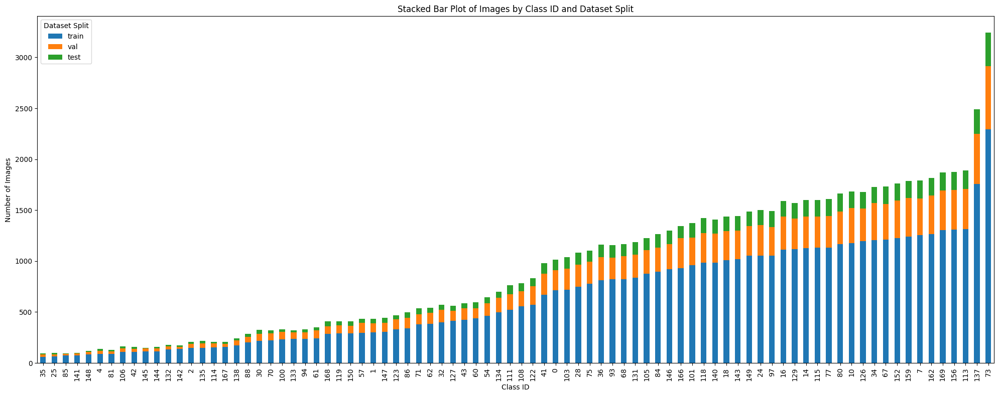

In [ ]:
df_pivot_images_P40 = df_investigate_split_P40.pivot_table(index='class_id', columns='set', values='# images')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_images_P40.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Images')
plt.title('Stacked Bar Plot of Images by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

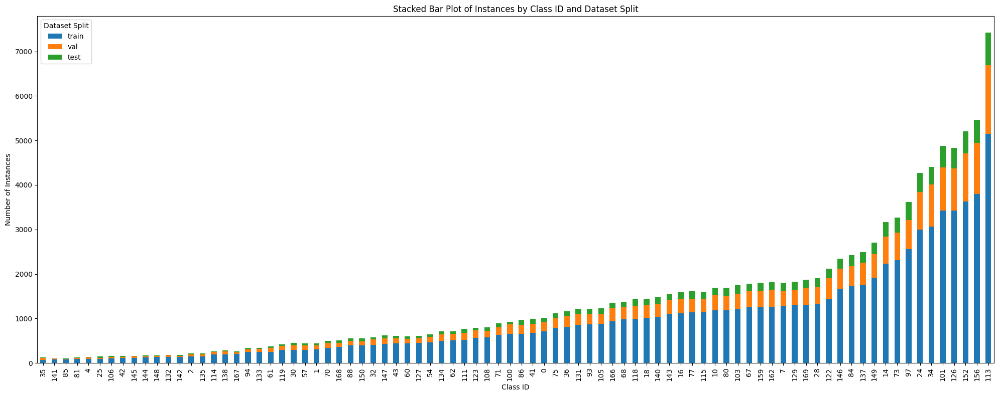

In [ ]:
df_pivot_instances_P40 = df_investigate_split_P40.pivot_table(index='class_id', columns='set', values='# instances')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_instances_P40.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Instances')
plt.title('Stacked Bar Plot of Instances by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

# learn custom class names todo

In [ ]:
new_class_dict

{'0': '1.0',
 '1': '1.1',
 '2': '1.2',
 '4': '1.7',
 '7': '2.0',
 '9': '2.3',
 '10': '3.0',
 '11': '3.1',
 '14': '5.0',
 '15': '5.1',
 '16': '6.0',
 '17': '6.1',
 '18': '7.0',
 '19': '7.1',
 '20': '7.2',
 '21': '7.3',
 '23': '7.7',
 '24': '8.0',
 '25': '8.3',
 '27': '8.5',
 '28': '9.0',
 '30': '9.4',
 '32': '10.0',
 '33': '10.1',
 '34': '11.0',
 '35': '11.1',
 '36': '13.0',
 '37': '13.1',
 '38': '13.2',
 '41': '14.0',
 '42': '14.1',
 '43': '14.2',
 '44': '14.3',
 '54': '19.0',
 '55': '19.1',
 '56': '19.2',
 '57': '19.3',
 '58': '19.4',
 '60': '20.0',
 '61': '20.1',
 '62': '20.2',
 '63': '20.3',
 '67': '23.0',
 '68': '23.1',
 '69': '23.2',
 '70': '24.0',
 '71': '24.1',
 '72': '24.3',
 '73': '26.0',
 '74': '26.1',
 '75': '27.0',
 '76': '27.1',
 '77': '28.0',
 '80': '29.0',
 '81': '29.1',
 '82': '29.2',
 '83': '29.4',
 '84': '30.0',
 '85': '30.1',
 '86': '32.0',
 '87': '32.1',
 '88': '32.2',
 '93': '35.0',
 '94': '35.1',
 '97': '37.0',
 '98': '37.1',
 '99': '37.3',
 '100': '37.4',
 '101':

In [ ]:
data = {
    'model_id': [i for i in range(173)],
    'class_id': [new_class_dict[str(i)] if str(i) in new_class_dict.keys() else None for i in range(173)],
    'name':     [matching_name_id[float(new_class_dict[str(i)])] if str(i) in new_class_dict.keys() else None for i in range(173)]
}

In [ ]:
df = pd.DataFrame(data=data)

In [ ]:
df.to_csv('/content/drive/MyDrive/fiber_optic_box_inspection/matching.csv', index=True, encoding='utf-8')

In [ ]:
new_class_dict.keys()

dict_keys(['0', '1', '2', '4', '7', '9', '10', '11', '14', '15', '16', '17', '18', '19', '20', '21', '23', '24', '25', '27', '28', '30', '32', '33', '34', '35', '36', '37', '38', '41', '42', '43', '44', '54', '55', '56', '57', '58', '60', '61', '62', '63', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '80', '81', '82', '83', '84', '85', '86', '87', '88', '93', '94', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '157', '158', '159', '160', '161', '162', '163', '164', '165', '166', '167', '168', '169', '170', '171', '172'])

In [ ]:
matching_name_id_df = pd.read_excel(paths['matching_name_id'], sheet_name=0)
matching_name_id = dict(zip(matching_name_id_df['Label ID'], matching_name_id_df['Tên Label']))
print(matching_name_id[1.0])

Tên tập điểm: sơn đỏ/đen(Đạt)


In [ ]:
matching_name_id

{1.0: 'Tên tập điểm: sơn đỏ/đen(Đạt)',
 1.1: 'Tên bị mờ',
 1.2: 'Giấy dán quảng cáo che',
 1.7: 'Sơn sai quy cách',
 2.0: 'Nắp tập điểm(Đạt)',
 2.1: 'Mất nắp tập điểm',
 2.3: 'Vỡ nắp tập điểm',
 3.0: 'Ốc khóa bán nguyệt(Đạt)',
 3.1: 'Mất ốc khóa bán nguyệt',
 4.0: 'Ốc vít khóa hộp(Đạt)',
 4.1: 'Mất ốc vít khóa hộp',
 5.0: 'Tai nhựa đóng/mở hộp (2 tai)(Đạt)',
 5.1: 'Vỡ tai nhựa đóng/mở hộp',
 6.0: 'Bản lề tập điểm(Đạt)',
 6.1: 'Vỡ bản lề tập điểm',
 7.0: 'Ống nhựa luồn cáp(Đạt)',
 7.1: 'Bắt cao/thấp so với đáy tập điểm',
 7.2: 'Không có ống nhựa luồn cáp',
 7.3: 'Ống nhựa luồn cáp đặt không đúng bên trái hộp',
 7.7: 'Vỡ ống nhựa luồn cáp',
 8.0: 'Đai inox(Đạt)',
 8.3: 'Đai inox đánh không chặt',
 8.5: 'Đai inox bị mất',
 9.0: 'Khóa đai inox(Đạt)',
 9.4: 'Khóa đai lắp không đúng vị trí theo quy định (lắp trên ống nhựa)',
 10.0: 'Khung đáy tập điểm(Đạt)',
 10.1: 'Khung đáy tập điểm vỡ',
 11.0: 'Gioăng cao su chống nước(Đạt)',
 11.1: 'Gioăng cao su chống nước bị mất',
 13.0: 'Cáp hạ tầng(Đ

In [ ]:
# id_to_names = matching_name_id_df.groupby(matching_name_id_df['Label ID'].astype(int))['Tên Label'].apply(list).to_dict()

# def find_names_by_id(integer_part):
#     return id_to_names.get(int(integer_part), ['ID not found'])

# integer_part = 0
# names = find_names_by_id(integer_part)
# print(f'Names for IDs with integer part {integer_part}: {names}')

In [ ]:
# id_to_names

# Prepare dataset configuration

### YOLO

In [ ]:
yolo_data_cfg_P00 = {
    'train': str(local_paths['train_paths_P00']),
    'val': str(local_paths['val_paths_P00']),
    'test': str(local_paths['test_paths_P00']),
    'nc': len(class_names_P00),
    'names': class_names_P00
}

with open(local_paths['yolo_data_cfg_P00'], 'w') as f:
    yaml.dump(yolo_data_cfg_P00, f, default_flow_style=False, sort_keys=False)

In [ ]:
yolo_data_cfg_P25 = {
    'train': str(local_paths['train_paths_P25']),
    'val': str(local_paths['val_paths_P25']),
    'test': str(local_paths['test_paths_P25']),
    'nc': len(class_names_P25),
    'names': class_names_P25
}

with open(local_paths['yolo_data_cfg_P25'], 'w') as f:
    yaml.dump(yolo_data_cfg_P25, f, default_flow_style=False, sort_keys=False)

In [ ]:
yolo_data_cfg_P30 = {
    'train': str(local_paths['train_paths_P30']),
    'val': str(local_paths['val_paths_P30']),
    'test': str(local_paths['test_paths_P30']),
    'nc': len(class_names_P30),
    'names': class_names_P30
}

with open(local_paths['yolo_data_cfg_P30'], 'w') as f:
    yaml.dump(yolo_data_cfg_P30, f, default_flow_style=False, sort_keys=False)

In [ ]:
yolo_data_cfg_P35 = {
    'train': str(local_paths['train_paths_P35']),
    'val': str(local_paths['val_paths_P35']),
    'test': str(local_paths['test_paths_P35']),
    'nc': len(class_names_P35),
    'names': class_names_P35
}

with open(local_paths['yolo_data_cfg_P35'], 'w') as f:
    yaml.dump(yolo_data_cfg_P35, f, default_flow_style=False, sort_keys=False)

In [ ]:
yolo_data_cfg_P40 = {
    'train': str(local_paths['train_paths_P40']),
    'val': str(local_paths['val_paths_P40']),
    'test': str(local_paths['test_paths_P40']),
    'nc': len(class_names_P40),
    'names': class_names_P40
}

with open(local_paths['yolo_data_cfg_P40'], 'w') as f:
    yaml.dump(yolo_data_cfg_P40, f, default_flow_style=False, sort_keys=False)

### detectron2

In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-77xb04b6
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-77xb04b6
  Resolved https://github.com/facebookresearch/detectron2.git to commit b15f64ec4429e23a148972175a0207c5a9ab84cf
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.3/81.3 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 46.2 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp311-cp311-linux_x86_64.whl size=6052896 sha256=24454a068c4102faca69470f02139a3806574b3ff94458fdd8079ea0d1e13607
  Stored in directory: /tmp/pip-ephem-wheel-cache-__t6aene/wheels/17/d9/40/60db98e485aa9455d

In [ ]:
import random

from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

In [ ]:
def extract_data_from_image_label(image_id: Path):
    record = {}

    filename = str(image_id.with_suffix('.jpg'))
    image_height, image_width = cv2.imread(filename).shape[:2]

    record['file_name'] = filename
    record['image_id'] = image_id.stem
    record['height'] = image_height
    record['width'] = image_width

    objs = []

    with open(image_id.with_suffix('.txt'), 'r') as f:
        lines = f.readlines()

    for line in lines:
        parts = line.strip().split(' ')
        class_id = int(parts[0])
        (x_center, y_center, bbox_width, bbox_height) = map(float, parts[1:5])
        x_min_abs = max(0.0, x_center * image_width - (bbox_width/2) * image_width)
        y_min_abs = max(0.0, y_center * image_height - (bbox_height/2) * image_height)
        bbox_width_abs = bbox_width * image_width
        bbox_height_abs = bbox_height * image_height

        obj = {
            'bbox': [np.int64(round(x_min_abs)), np.int64(round(y_min_abs)), np.int64(round(bbox_width_abs)), np.int64(round(bbox_height_abs))],
            'bbox_mode': BoxMode.XYWH_ABS,
            'category_id': class_id,
        }
        objs.append(obj)

    record['annotations'] = objs
    return record


def get_data_from_subset(subset: Path):
    dataset_dicts = []
    with open(subset, 'r') as f:
        image_ids = [Path(line.strip()) for line in f.readlines()]

    with Pool() as pool:
        results = pool.map(extract_data_from_image_label, image_ids)

    dataset_dicts.extend(results)
    return dataset_dicts

In [ ]:
DatasetCatalog

DatasetCatalog(registered datasets: fiber_optic_train, fiber_optic_val, fiber_optic_test, fiber_optic_train_1_crop)

In [ ]:
DatasetCatalog.clear()
MetadataCatalog.clear()
for d in [
    local_paths['train_paths'],
    local_paths['val_paths'],
    local_paths['test_paths'],
    local_paths['train_paths_crop']
]:
    DatasetCatalog.register('fiber_optic_' + d.stem, lambda d=d: get_data_from_subset(d))
    MetadataCatalog.get('fiber_optic_' + d.stem).set(thing_classes=read_class_names())

namespace(name='fiber_optic',
          thing_classes=['1.0',
                         '1.1',
                         '1.2',
                         '',
                         '1.7',
                         '',
                         '',
                         '2.0',
                         '',
                         '2.3',
                         '3.0',
                         '3.1',
                         '',
                         '',
                         '5.0',
                         '5.1',
                         '6.0',
                         '6.1',
                         '7.0',
                         '7.1',
                         '7.2',
                         '7.3',
                         '',
                         '7.7',
                         '8.0',
                         '8.3',
                         '',
                         '8.5',
                         '9.0',
                         '',
                         '9.4',
     

In [ ]:
fiber_optic_metadata = MetadataCatalog.get('fiber_optic')

In [ ]:
train_dicts = get_data_from_subset(local_paths['train_paths'])
val_dicts = get_data_from_subset(local_paths['val_paths'])
train_1_crop_dicts = get_data_from_subset(local_paths['train_paths_crop'])

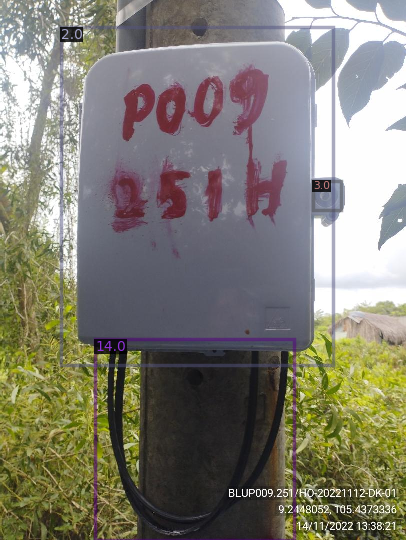

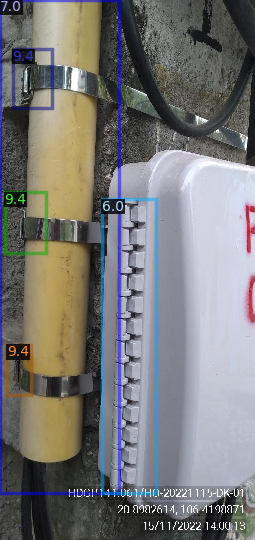

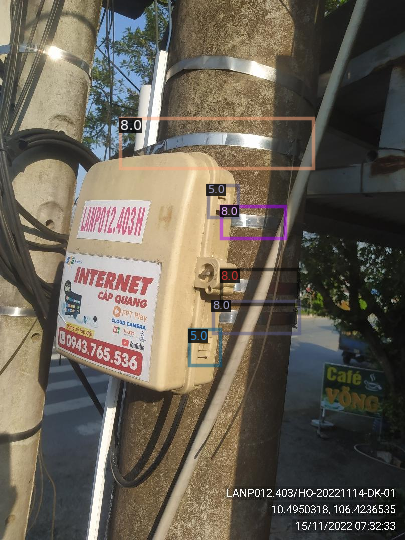

In [ ]:
for d in random.sample(train_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=fiber_optic_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

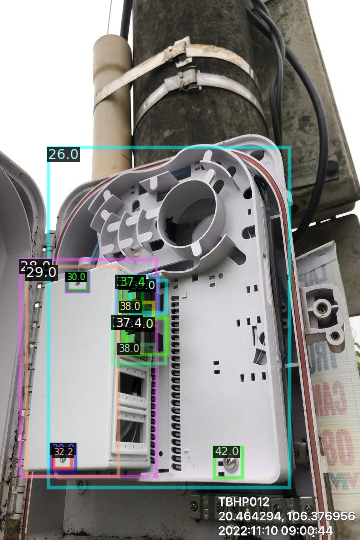

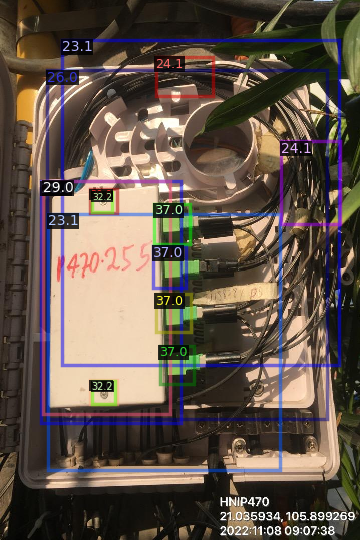

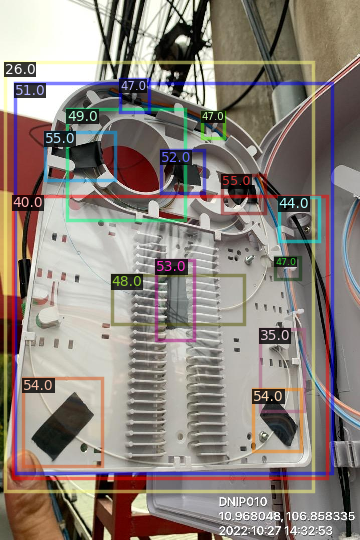

In [ ]:
for d in random.sample(train_1_crop_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=fiber_optic_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Backup processed files and configurations

In [ ]:
!rm -rf {local_paths['processed_dataset_compressed']}
!rm -rf {paths['dataset_dir']}

In [ ]:
def compress_folders_to_tar_gz(folders, output_tar_gz):
    try:
        with tarfile.open(output_tar_gz, 'w:gz') as tar:
            for folder in folders:
                if not folder.is_dir():
                    print(f'Error: {folder} is not a directory or does not exist.')
                    continue
                tar.add(folder, arcname=folder.name)
                print(f'Added folder: {folder}')
        print(f'Created archive: {output_tar_gz}')
        return True
    except Exception as e:
        print(f'Error creating archive: {e}')
        return False

In [ ]:
compress_folders_to_tar_gz(
    [
        # local_paths['image_label_dir'],
        # local_paths['label_bbox_backup_dir'],
        # local_paths['label_id_backup_dir'],

        # local_paths['empty_data_P00_dir'],
        # local_paths['image_label_P00_dir'],
        # local_paths['label_id_backup_P00_dir'],
        # local_paths['empty_data_P25_dir'],
        # local_paths['image_label_P25_dir'],
        # local_paths['label_id_backup_P25_dir'],
        # local_paths['empty_data_P30_dir'],
        # local_paths['image_label_P30_dir'],
        # local_paths['label_id_backup_P30_dir'],
        # local_paths['empty_data_P35_dir'],
        # local_paths['image_label_P35_dir'],
        # local_paths['label_id_backup_P35_dir'],

        local_paths['empty_data_P40_dir'],
        local_paths['image_label_P40_dir'],
        local_paths['label_id_backup_P40_dir'],
        local_paths['image_label_P40_aug_1_dir'],
        local_paths['image_label_P40_aug_2_dir'],
        local_paths['image_label_P40_aug_3_dir'],
        local_paths['image_label_P40_aug_4_dir'],
    ],
    local_paths['processed_dataset_compressed']
)

Added folder: /content/dataset_v2_ALL/empty_data_P40
Added folder: /content/dataset_v2_ALL/image_label_P40
Added folder: /content/dataset_v2_ALL/label_id_backup_P40
Added folder: /content/dataset_v2_ALL/image_label_P40_aug_1
Added folder: /content/dataset_v2_ALL/image_label_P40_aug_2
Added folder: /content/dataset_v2_ALL/image_label_P40_aug_3
Added folder: /content/dataset_v2_ALL/image_label_P40_aug_4
Created archive: /content/dataset_v2_ALL/processed_dataset.tar.gz


True

In [ ]:
def copy_folder_exclude(src_dir, dst_dir, exclude_entries=None):
    if exclude_entries is None:
        exclude_entries = set()

    try:
        def ignore_func(directory, contents):
            return [entry for entry in contents if entry in exclude_entries]

        shutil.copytree(src_dir, dst_dir, ignore=ignore_func, dirs_exist_ok=True)
        print(f'Folder copied to: {dst_dir}')
        return True
    except FileNotFoundError:
        print(f'Error: Source directory {src_dir} not found.')
        return False
    except FileExistsError:
        print(f'Error: Destination directory {dst_dir} already exists and cannot be overwritten.')
        return False
    except Exception as e:
        print(f'Error copying folder: {e}')
        return False

In [ ]:
paths['dataset_dir']

PosixPath('/content/drive/MyDrive/fiber_optic_box_inspection/dataset_v2_ALL')

In [ ]:
exclude = {
        local_paths['image_label_dir'].stem,
        local_paths['label_bbox_backup_dir'].stem,
        local_paths['label_id_backup_dir'].stem,

        local_paths['empty_data_P00_dir'].stem,
        local_paths['image_label_P00_dir'].stem,
        local_paths['label_id_backup_P00_dir'].stem,
        local_paths['empty_data_P25_dir'].stem,
        local_paths['image_label_P25_dir'].stem,
        local_paths['label_id_backup_P25_dir'].stem,
        local_paths['empty_data_P30_dir'].stem,
        local_paths['image_label_P30_dir'].stem,
        local_paths['label_id_backup_P30_dir'].stem,
        local_paths['empty_data_P35_dir'].stem,
        local_paths['image_label_P35_dir'].stem,
        local_paths['label_id_backup_P35_dir'].stem,

        local_paths['empty_data_P40_dir'].stem,
        local_paths['image_label_P40_dir'].stem,
        local_paths['label_id_backup_P40_dir'].stem,
        local_paths['image_label_P40_aug_1_dir'].stem,
        local_paths['image_label_P40_aug_2_dir'].stem,
        local_paths['image_label_P40_aug_3_dir'].stem,
        local_paths['image_label_P40_aug_4_dir'].stem,
}
copy_folder_exclude(local_paths['dataset_dir'], paths['dataset_dir'], exclude)

Folder copied to: /content/drive/MyDrive/fiber_optic_box_inspection/dataset_v2_ALL


True

In [ ]:
print(local_paths['processed_dataset_compressed'].stat().st_size == paths['processed_dataset_compressed'].stat().st_size)

True


# Augmentation

## augmentation utils

In [ ]:
def extract_data_from_label(label_path):
    class_labels, bboxes = [], []
    with open(label_path, 'r') as f:
        lines = f.readlines()

    for line in lines:
        (class_id, x_center, y_center, width, height) = line.strip().split(' ')
        if int(class_id) != 106:
            continue
        class_labels.append(int(class_id))
        bboxes.append([float(x_center), float(y_center), float(width), float(height)])
    return np.array(class_labels), np.array(bboxes, dtype=np.float32)

In [ ]:
def transform_image(args):
    image_id, transform_pipeline, dest = args
    image = cv2.imread(image_id.with_suffix('.jpg'))

    class_labels, bboxes = extract_data_from_label(image_id.with_suffix('.txt'))

    augmented = transform_pipeline(image=image, bboxes=bboxes, class_labels=class_labels)

    new_image_id = Path(dest, image_id.stem)
    new_image_path = new_image_id.with_suffix('.jpg')
    new_label_path = new_image_id.with_suffix('.txt')

    cv2.imwrite(new_image_path, augmented['image'])
    with open(new_label_path, 'w') as f:
        for bbox, label in zip(augmented['bboxes'], augmented['class_labels']):
            f.write(f'{label} {bbox[0]} {bbox[1]} {bbox[2]} {bbox[3]}\n')

def transform_images(ids, transform_pipeline, dest):
    agrs = [(id, transform_pipeline, dest) for id in ids]
    with Pool() as pool:
        results = pool.map(transform_image, agrs)
    print(results)

In [ ]:
def draw_bboxes(image_np, bboxes, labels, class_name_map=None, color=(0, 0, 255), thickness=2):
    img_res = image_np.copy()
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1
    font_thickness = 2

    h, w, _ = img_res.shape

    if not isinstance(bboxes, np.ndarray):
        print(f'Warning: bboxes is not an ndarray: {type(bboxes)}')
        return img_res
    if not isinstance(labels, np.ndarray):
        print(f'Warning: labels is not an ndarray: {type(labels)}')
        # Attempt to proceed if labels seem usable, otherwise return
        if len(bboxes) != len(labels):
            print('Warning: bbox and label length mismatch, cannot draw labels.')
            labels = np.array(['?' for _ in bboxes]) # Placeholder
        elif labels.dtype == object:
             print('Warning: labels contain object dtype, converting to string.')
             labels = labels.astype(str)

    for bbox, label in zip(bboxes, labels):
        # Assuming bbox format allows direct conversion to int x_min, y_min, x_max, y_max
        # This might need adjustment based on the ACTUAL format in your bboxes list
        # Example for pascal_voc or albumentations (after denormalizing)
        try:
             # Check if bbox has at least 4 elements
            if len(bbox) < 4:
                print(f'Warning: Skipping invalid bbox (fewer than 4 coords): {bbox}')
                continue
            x_center, y_center, width, height = map(float, bbox[:4])
            x_min, y_min, x_max, y_max = (x_center - width/2)*w, (y_center - height/2)*h, (x_center + width/2)*w, (y_center + height/2)*h
            x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])
        except (ValueError, TypeError) as e:
            print(f'Warning: Could not convert bbox coords to int: {bbox}, Error: {e}')
            continue # Skip this bbox

        cv2.rectangle(img_res, (x_min, y_min), (x_max, y_max), color, thickness)

        label_name = str(label) if class_name_map is None else class_name_map.get(label, str(label))
        # Simple text placement above the box
        # (text_width, text_height), baseline = cv2.getTextSize(label_name, font, font_scale, font_thickness)
        # text_y = y_min - baseline if y_min - baseline > text_height else y_min + text_height
        # cv2.putText(img_res, label_name, (x_min, text_y), font, font_scale, color, font_thickness)

        cv2.putText(img_res, label_name, (x_min, y_min-10), cv2.FONT_HERSHEY_DUPLEX, 0.8, color, 2, cv2.LINE_4)


    return img_res

In [ ]:
def visualize(image_stem: Path, all_dir: list[Path]):
    all_dir = sorted(all_dir)
    augmented_ids = []
    for dir in all_dir:
        id = Path(dir, image_stem)
        if not id.with_suffix('.jpg').exists():
            continue
        if dir == local_paths['image_label_P40_dir']:
            image_id = id
        else:
            augmented_ids.append(id)

    image = cv2.imread(image_id.with_suffix('.jpg'))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    class_labels, bboxes = extract_data_from_label(image_id.with_suffix('.txt'))

    print(augmented_ids)

    figure, ax = plt.subplots(1, len(augmented_ids) + 1, figsize=(30, 10))
    if len(augmented_ids) == 0:
        ax = [ax]

    # Draw original
    original_drawn = draw_bboxes(image, bboxes, class_labels)
    ax[0].imshow(original_drawn)
    ax[0].set_title('Original')
    ax[0].axis('off')

    for idx, augmented_id in enumerate(augmented_ids):
        aug_image = cv2.imread(augmented_id.with_suffix('.jpg'))
        aug_image = cv2.cvtColor(aug_image, cv2.COLOR_BGR2RGB)
        aug_class_labels, aug_bboxes = extract_data_from_label(augmented_id.with_suffix('.txt'))

        augmented_drawn = draw_bboxes(aug_image, aug_bboxes, aug_class_labels)
        # cv2_imshow(augmented_drawn)
        ax[idx+1].imshow(augmented_drawn)
        ax[idx+1].set_title(augmented_id.parent.stem.replace(f'{image_id.parent.stem}_', ''))
        ax[idx+1].axis('off')
    plt.tight_layout()
    plt.show()

## Stage 1 - Crop

In [ ]:
aug_1_transform_pipeline = A.Compose([
    A.SmallestMaxSize(max_size=1280, p=1.0),
    A.RandomCrop(height=IMGSZ, width=960, p=1.0),
], bbox_params=A.BboxParams(format='yolo',
                            label_fields=['class_labels']
                            ))

In [ ]:
aug_none_train_images = read_image_paths(local_paths['train_paths_P40'])
print(len(aug_none_train_images))

7403


In [ ]:
aug_none_train_ids = [image.with_suffix('') for image in aug_none_train_images]
print(len(aug_none_train_ids))

7403


In [ ]:
aug_1_train_ids, _ = train_test_split(aug_none_train_ids, train_size=0.5, random_state=42)
print(len(aug_1_train_ids))

3701


In [ ]:
aug_1_ignore_id = set()
for class_id in {41, 42, 43, 54, 60, 61, 62}:
    aug_1_ignore_id.update(investigate_all_P40[class_id][0])
print(len(aug_1_ignore_id))

2055


In [ ]:
aug_1_train_ids = [aug_1_train_id for aug_1_train_id in aug_1_train_ids if aug_1_train_id.stem not in aug_1_ignore_id]
print(len(aug_1_train_ids))

2968


In [ ]:
!rm -rf {local_paths['image_label_P40_aug_1_dir']}
if not local_paths['image_label_P40_aug_1_dir'].exists():
    Path.mkdir(local_paths['image_label_P40_aug_1_dir'])

In [ ]:
transform_images(aug_1_train_ids, aug_1_transform_pipeline, local_paths['image_label_P40_aug_1_dir'])

[None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, Non

In [ ]:
# # TEST ORIGIN
# class_labels, bboxes = extract_data_from_label('/content/dataset_v2_ALL/image_label/2022_11_04_09_55_36-TNNP070116HO.txt')
# print(class_labels, bboxes)
# image = cv2.imread('/content/dataset_v2_ALL/image_label/2022_11_04_09_55_36-TNNP070116HO.jpg')
# augmented_img = transform_pipeline_1_crop(image=image, bboxes=bboxes, class_labels=class_labels)
# cv2_imshow(draw_bboxes(image_np=augmented_img['image'], bboxes=augmented_img['bboxes'], labels=augmented_img['class_labels']))
# del image, class_labels, bboxes, augmented_img

In [ ]:
# # TEST AUGMENTED
# class_labels, bboxes = extract_data_from_label('/content/dataset_v2_ALL/image_label_P35_1_crop/2022_11_04_09_55_36-TNNP070116HO.txt')
# print(class_labels, bboxes)
# image = cv2.imread('/content/dataset_v2_ALL/image_label_P35_1_crop/2022_11_04_09_55_36-TNNP070116HO.jpg')
# # augmented_img = transform_pipeline_1_crop(image=image, bboxes=bboxes, class_labels=class_labels)
# # cv2_imshow(draw_bboxes(image_np=augmented_img['image'], bboxes=augmented_img['bboxes'], labels=augmented_img['class_labels']))
# cv2_imshow(draw_bboxes(image_np=image, bboxes=bboxes, labels=class_labels))
# del image, class_labels, bboxes
# # del augmented_img

In [ ]:
# visualize(aug_1_train_ids[0], local_paths['image_label_P40_aug_1_dir'])

In [ ]:
aug_1_train_images = [Path(local_paths['image_label_P40_aug_1_dir'], f) for f in Path.iterdir(local_paths['image_label_P40_aug_1_dir']) if f.suffix == '.jpg']
aug_none_1_train_images = []
aug_none_1_train_images.extend(aug_none_train_images)
aug_none_1_train_images.extend(aug_1_train_images)
write_image_paths(aug_none_1_train_images, local_paths['train_paths_P40_aug_1'])
print(len(aug_none_train_images)+len(aug_1_train_images)==len(aug_none_1_train_images), len(aug_none_1_train_images))

True 10371


In [ ]:
yolo_data_cfg_P40_aug_1 = {
    'train': str(local_paths['train_paths_P40_aug_1']),
    'val': str(local_paths['val_paths_P40']),
    'test': str(local_paths['test_paths_P40']),
    'nc': len(class_names_P40),
    'names': class_names_P40
}

with open(local_paths['yolo_data_cfg_P40_aug_1'], 'w') as f:
    yaml.dump(yolo_data_cfg_P40_aug_1, f, default_flow_style=False, sort_keys=False)

In [ ]:
with open('/content/dataset_v2_ALL/train_P40_aug_1.txt', 'r') as f:
    lines = f.readlines()
count = 0
for line in [line.strip() for line in lines]:
    if not Path(line).exists():
        print(line)
        count += 1
print(count)

0


## Stage 2 - Affine Perspective

In [ ]:
aug_2_transform_pipeline = A.Compose([
    A.OneOf([
        A.Affine(
            scale=(0.8, 1.2), rotate=(-15, 15),
            translate_percent=(-0.1, 0.1), p=1
        ),
        A.Perspective(scale=(0.05, 0.1), p=1)
    ], p=0.5),
], bbox_params=A.BboxParams(format='yolo',
                            label_fields=['class_labels']
                            ))

In [ ]:
aug_none_1_train_images = read_image_paths(local_paths['train_paths_P40_aug_1'])
print(len(aug_none_1_train_images))

10371


In [ ]:
aug_none_1_train_ids = [image.with_suffix('') for image in aug_none_1_train_images]
print(len(aug_none_1_train_ids))

10371


In [ ]:
len({35, 85, 25, 141, 148, 81, 4, 145, 144, 42, 106, 142, 132, 114, 167, 2, 135, 138, 88, 70, 133, 30, 94, 100, 61})

25

In [ ]:
aug_2_accept_id = set()
for class_id in {35, 85, 25, 141, 148, 81, 4, 145, 144, 42, 106, 142, 132, 114, 167, 2, 135, 138, 88, 70, 133, 30, 94, 100, 61}:
    aug_2_accept_id.update(investigate_all_P40[class_id][0])
print(len(aug_2_accept_id))

3795


In [ ]:
aug_2_train_ids = []
for id in aug_2_accept_id:
    path1 = Path(local_paths['image_label_P40_dir'], id).with_suffix('.jpg')
    if path1.exists():
        aug_2_train_ids.append(path1)
    path2 = Path(local_paths['image_label_P40_aug_1_dir'], id).with_suffix('.jpg')
    if path2.exists():
        aug_2_train_ids.append(path2)
print(len(aug_2_train_ids))

4871


In [ ]:
aug_2_ignore_id = set()
for class_id in {41, 42, 43, 54, 60, 61, 62}:
    aug_2_ignore_id.update(investigate_all_P40[class_id][0])
print(len(aug_2_ignore_id))

2055


[]


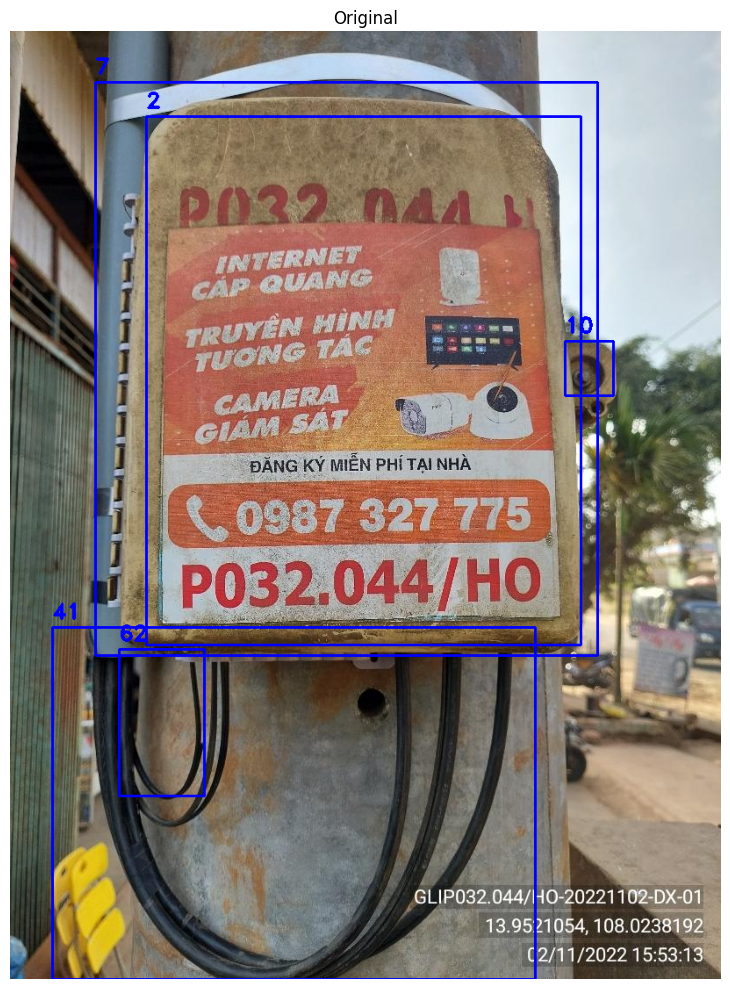

In [ ]:
visualize(
    list(aug_2_ignore_id)[2],
     [local_paths['image_label_P40_dir'],
    #   local_paths['image_label_P40_aug_1_dir'],
    #   local_paths['image_label_P40_aug_2_dir'],
    #   local_paths['image_label_P40_aug_3_dir'],
    #   local_paths['image_label_P40_aug_4_dir']
      ])

In [ ]:
aug_2_train_ids = [aug_2_train_id for aug_2_train_id in aug_2_train_ids if aug_2_train_id.stem not in aug_2_ignore_id]
print(len(aug_2_train_ids))

4176


In [ ]:
!rm -rf {local_paths['image_label_P40_aug_2_dir']}
if not local_paths['image_label_P40_aug_2_dir'].exists():
    Path.mkdir(local_paths['image_label_P40_aug_2_dir'])

In [ ]:
transform_images(aug_2_train_ids, aug_2_transform_pipeline, local_paths['image_label_P40_aug_2_dir'])

[None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, Non

In [ ]:
# # TEST ORIGIN
# class_labels, bboxes = extract_data_from_label('/content/dataset_v2_ALL/image_label/2022_11_04_09_55_36-TNNP070116HO.txt')
# print(class_labels, bboxes)
# image = cv2.imread('/content/dataset_v2_ALL/image_label/2022_11_04_09_55_36-TNNP070116HO.jpg')
# augmented_img = transform_pipeline_1_crop(image=image, bboxes=bboxes, class_labels=class_labels)
# cv2_imshow(draw_bboxes(image_np=augmented_img['image'], bboxes=augmented_img['bboxes'], labels=augmented_img['class_labels']))
# del image, class_labels, bboxes, augmented_img

In [ ]:
# # TEST AUGMENTED
# class_labels, bboxes = extract_data_from_label('/content/dataset_v2_ALL/image_label_P35_1_crop/2022_11_04_09_55_36-TNNP070116HO.txt')
# print(class_labels, bboxes)
# image = cv2.imread('/content/dataset_v2_ALL/image_label_P35_1_crop/2022_11_04_09_55_36-TNNP070116HO.jpg')
# # augmented_img = transform_pipeline_1_crop(image=image, bboxes=bboxes, class_labels=class_labels)
# # cv2_imshow(draw_bboxes(image_np=augmented_img['image'], bboxes=augmented_img['bboxes'], labels=augmented_img['class_labels']))
# cv2_imshow(draw_bboxes(image_np=image, bboxes=bboxes, labels=class_labels))
# del image, class_labels, bboxes
# # del augmented_img

In [ ]:
# visualize(aug_2_train_ids[1], local_paths['image_label_P40_aug_2_dir'])

In [ ]:
aug_2_train_images = [Path(local_paths['image_label_P40_aug_2_dir'], f) for f in Path.iterdir(local_paths['image_label_P40_aug_2_dir']) if f.suffix == '.jpg']
aug_none_1_2_train_images = []
aug_none_1_2_train_images.extend(aug_none_train_images)
aug_none_1_2_train_images.extend(aug_1_train_images)
aug_none_1_2_train_images.extend(aug_2_train_images)
write_image_paths(aug_none_1_2_train_images, local_paths['train_paths_P40_aug_2'])
print(len(aug_none_train_images)+len(aug_1_train_images)+len(aug_2_train_images)==len(aug_none_1_2_train_images),
      len(aug_none_1_2_train_images))

True 13471


In [ ]:
yolo_data_cfg_P40_aug_2 = {
    'train': str(local_paths['train_paths_P40_aug_2']),
    'val': str(local_paths['val_paths_P40']),
    'test': str(local_paths['test_paths_P40']),
    'nc': len(class_names_P40),
    'names': class_names_P40
}

with open(local_paths['yolo_data_cfg_P40_aug_2'], 'w') as f:
    yaml.dump(yolo_data_cfg_P40_aug_2, f, default_flow_style=False, sort_keys=False)

In [ ]:
with open('/content/dataset_v2_ALL/train_P40_aug_2.txt', 'r') as f:
    lines = f.readlines()
count = 0
for line in [line.strip() for line in lines]:
    if not Path(line).exists():
        print(line)
        count += 1
print(count)

0


## Stage 3 - sunflare/shadow

In [ ]:
aug_3_transform_pipeline = A.Compose([
    A.OneOf([
        A.RandomSunFlare(
            flare_roi=[0, 0, 1, 0.5],
            src_radius=50,
            src_color=[255, 255, 255],
            angle_range=[0, 1],
            num_flare_circles_range=[6, 10],
            method="overlay"
        ),
        A.RandomShadow(
            shadow_roi=[0, 0.5, 1, 1],
            num_shadows_limit=[2, 3],
            shadow_dimension=4,
            shadow_intensity_range=[0.2, 0.3]
        )
    ], p=0.5),
], bbox_params=A.BboxParams(format='yolo',
                            label_fields=['class_labels']
                            ))

/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()


In [ ]:
aug_none_1_2_train_images = read_image_paths(local_paths['train_paths_P40_aug_2'])
print(len(aug_none_1_2_train_images))

13471


In [ ]:
aug_none_1_2_train_ids = [image.with_suffix('') for image in aug_none_1_2_train_images]
print(len(aug_none_1_2_train_ids))

13471


In [ ]:
# aug_2_accept_id = set()
# for class_id in {35, 85, 25, 141, 148, 81, 4, 145, 144, 42, 106, 142, 132, 114, 167, 2, 135, 138, 88, 70, 133, 30, 94, 100, 61}:
#     aug_2_accept_id.update(investigate_all_P40[class_id][0])
# print(len(aug_2_accept_id))

In [ ]:
# aug_2_train_ids = []
# for id in aug_2_accept_id:
#     path1 = Path(local_paths['image_label_P40_dir'], id).with_suffix('.jpg')
#     if path1.exists():
#         aug_2_train_ids.append(path1)
#     path2 = Path(local_paths['image_label_P40_aug_1_dir'], id).with_suffix('.jpg')
#     if path2.exists():
#         aug_2_train_ids.append(path2)
# print(len(aug_2_train_ids))

In [ ]:
aug_3_train_ids, _ = train_test_split(aug_none_1_2_train_ids, train_size=0.1, random_state=42)
print(len(aug_3_train_ids))

1347


In [ ]:
aug_3_ignore_id = set()
for class_id in {106}:
    aug_3_ignore_id.update(investigate_all_P40[class_id][0])
print(len(aug_3_ignore_id))

162


[]


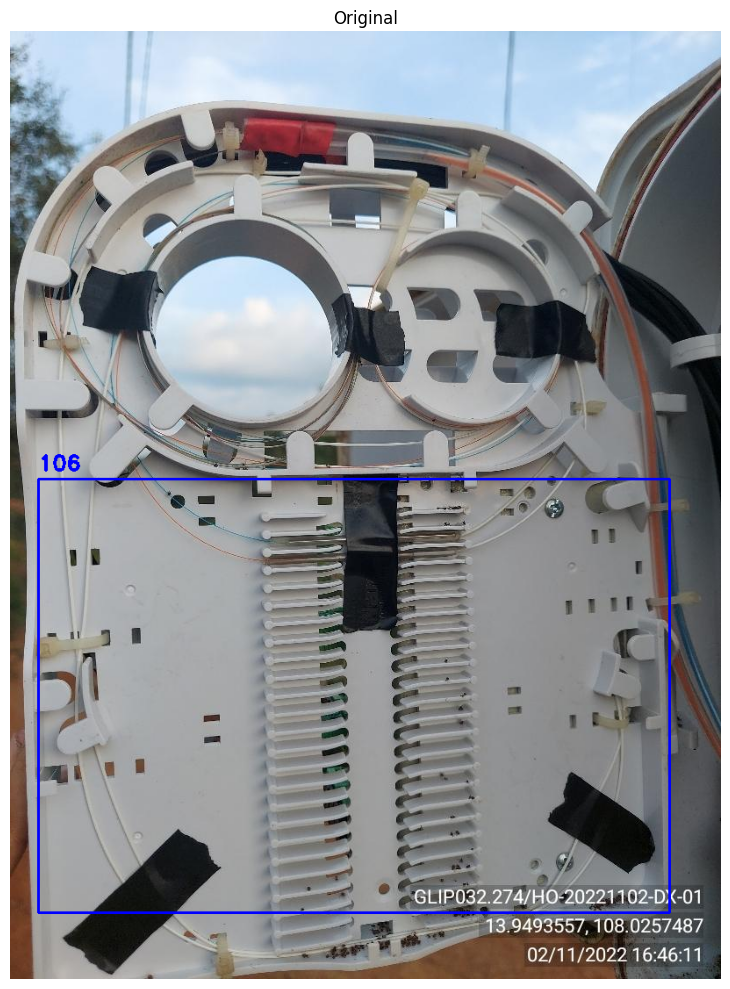

In [ ]:
visualize(
    list(aug_3_ignore_id)[0],
     [local_paths['image_label_P40_dir'],
    #   local_paths['image_label_P40_aug_1_dir'],
    #   local_paths['image_label_P40_aug_2_dir'],
    #   local_paths['image_label_P40_aug_3_dir'],
    #   local_paths['image_label_P40_aug_4_dir']
      ])

In [ ]:
aug_3_105 = set()
for class_id in {105}:
    aug_3_105.update(investigate_all_P40[class_id][0])
print(len(aug_3_105))

1227


1227
[]


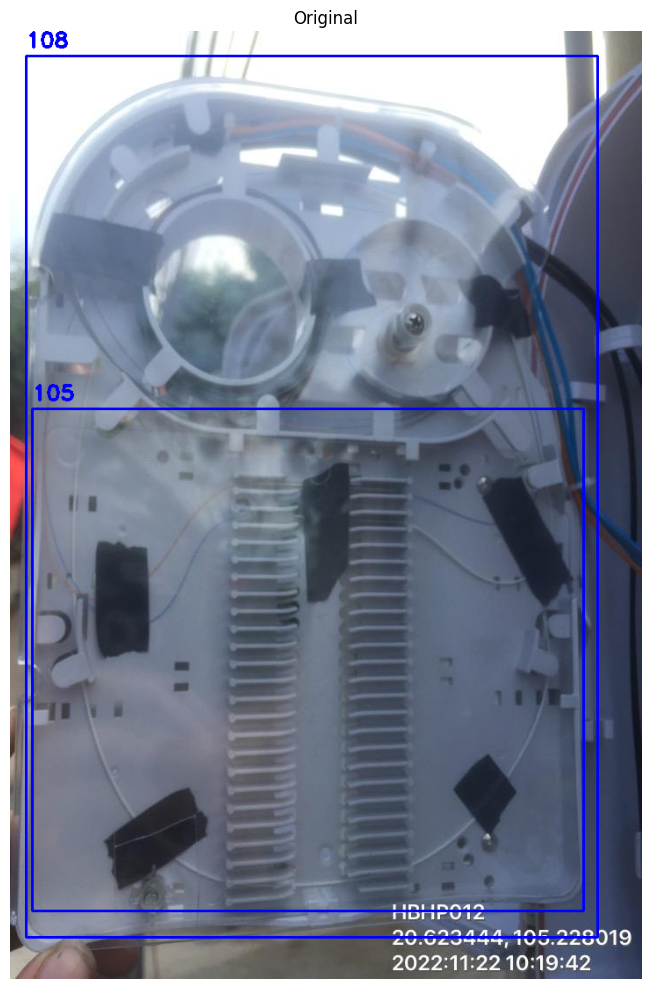

In [ ]:
visualize(
    list(aug_3_105)[10],
     [local_paths['image_label_P40_dir'],
    #   local_paths['image_label_P40_aug_1_dir'],
    #   local_paths['image_label_P40_aug_2_dir'],
    #   local_paths['image_label_P40_aug_3_dir'],
    #   local_paths['image_label_P40_aug_4_dir']
      ])

In [ ]:
aug_3_train_ids = [aug_3_train_id for aug_3_train_id in aug_3_train_ids if aug_3_train_id.stem not in aug_3_ignore_id]
print(len(aug_3_train_ids))

1321


In [ ]:
!rm -rf {local_paths['image_label_P40_aug_3_dir']}
if not local_paths['image_label_P40_aug_3_dir'].exists():
    Path.mkdir(local_paths['image_label_P40_aug_3_dir'])

In [ ]:
transform_images(aug_3_train_ids, aug_3_transform_pipeline, local_paths['image_label_P40_aug_3_dir'])

[None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, Non

In [ ]:
# # TEST ORIGIN
# class_labels, bboxes = extract_data_from_label('/content/dataset_v2_ALL/image_label/2022_11_04_09_55_36-TNNP070116HO.txt')
# print(class_labels, bboxes)
# image = cv2.imread('/content/dataset_v2_ALL/image_label/2022_11_04_09_55_36-TNNP070116HO.jpg')
# augmented_img = transform_pipeline_1_crop(image=image, bboxes=bboxes, class_labels=class_labels)
# cv2_imshow(draw_bboxes(image_np=augmented_img['image'], bboxes=augmented_img['bboxes'], labels=augmented_img['class_labels']))
# del image, class_labels, bboxes, augmented_img

In [ ]:
# # TEST AUGMENTED
# class_labels, bboxes = extract_data_from_label('/content/dataset_v2_ALL/image_label_P35_1_crop/2022_11_04_09_55_36-TNNP070116HO.txt')
# print(class_labels, bboxes)
# image = cv2.imread('/content/dataset_v2_ALL/image_label_P35_1_crop/2022_11_04_09_55_36-TNNP070116HO.jpg')
# # augmented_img = transform_pipeline_1_crop(image=image, bboxes=bboxes, class_labels=class_labels)
# # cv2_imshow(draw_bboxes(image_np=augmented_img['image'], bboxes=augmented_img['bboxes'], labels=augmented_img['class_labels']))
# cv2_imshow(draw_bboxes(image_np=image, bboxes=bboxes, labels=class_labels))
# del image, class_labels, bboxes
# # del augmented_img

In [ ]:
aug_3_train_ids[30]

PosixPath('/content/dataset_v2_ALL/image_label_P40_aug_2/2022_12_27_10_15_07-TBHP004037HO')

[PosixPath('/content/dataset_v2_ALL/image_label_P40_aug_1/2022_11_07_10_11_17-CBGP004036HO'), PosixPath('/content/dataset_v2_ALL/image_label_P40_aug_2/2022_11_07_10_11_17-CBGP004036HO'), PosixPath('/content/dataset_v2_ALL/image_label_P40_aug_3/2022_11_07_10_11_17-CBGP004036HO')]


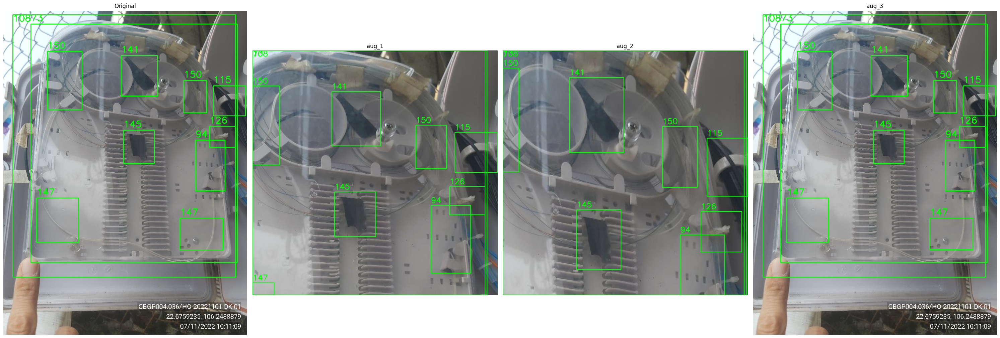

In [ ]:
visualize(
    aug_3_train_ids[31].stem,
     [local_paths['image_label_P40_dir'],
      local_paths['image_label_P40_aug_1_dir'],
      local_paths['image_label_P40_aug_2_dir'],
      local_paths['image_label_P40_aug_3_dir']])

In [ ]:
aug_3_train_images = [Path(local_paths['image_label_P40_aug_3_dir'], f) for f in Path.iterdir(local_paths['image_label_P40_aug_3_dir']) if f.suffix == '.jpg']
aug_none_1_2_3_train_images = []
aug_none_1_2_3_train_images.extend(aug_none_train_images)
aug_none_1_2_3_train_images.extend(aug_1_train_images)
aug_none_1_2_3_train_images.extend(aug_2_train_images)
aug_none_1_2_3_train_images.extend(aug_3_train_images)
write_image_paths(aug_none_1_2_3_train_images, local_paths['train_paths_P40_aug_3'])
print(len(aug_none_train_images)+len(aug_1_train_images)+len(aug_2_train_images)+len(aug_3_train_images)==len(aug_none_1_2_3_train_images),
      len(aug_none_1_2_3_train_images))

True 14713


In [ ]:
yolo_data_cfg_P40_aug_3 = {
    'train': str(local_paths['train_paths_P40_aug_3']),
    'val': str(local_paths['val_paths_P40']),
    'test': str(local_paths['test_paths_P40']),
    'nc': len(class_names_P40),
    'names': class_names_P40
}

with open(local_paths['yolo_data_cfg_P40_aug_3'], 'w') as f:
    yaml.dump(yolo_data_cfg_P40_aug_3, f, default_flow_style=False, sort_keys=False)

In [ ]:
with open('/content/dataset_v2_ALL/train_P40_aug_3.txt', 'r') as f:
    lines = f.readlines()
count = 0
for line in [line.strip() for line in lines]:
    if not Path(line).exists():
        print(line)
        count += 1
print(count)

0


## Stage 4 - mosaic

In [ ]:
aug_4_transform_pipeline = A.Compose([
    A.Mosaic(
        grid_yx=[2, 2],
        target_size=[960, 960],
        cell_shape=[960, 960],
        center_range=[0.3, 0.7],
        fit_mode="cover",
        interpolation=cv2.INTER_LINEAR,
        mask_interpolation=cv2.INTER_NEAREST,
        fill=0,
        fill_mask=0,
        p=1,
    ),
], bbox_params=A.BboxParams(format='yolo',
                            label_fields=['bbox_labels']
                            ))

In [ ]:
aug_none_1_2_3_train_images = read_image_paths(local_paths['train_paths_P40_aug_3'])
print(len(aug_none_1_2_3_train_images))

14713


In [ ]:
aug_none_1_2_3_train_ids = [image.with_suffix('') for image in aug_none_1_2_3_train_images]
print(len(aug_none_1_2_3_train_ids))

14713


In [ ]:
# aug_2_accept_id = set()
# for class_id in {35, 85, 25, 141, 148, 81, 4, 145, 144, 42, 106, 142, 132, 114, 167, 2, 135, 138, 88, 70, 133, 30, 94, 100, 61}:
#     aug_2_accept_id.update(investigate_all_P40[class_id][0])
# print(len(aug_2_accept_id))

In [ ]:
# aug_2_train_ids = []
# for id in aug_2_accept_id:
#     path1 = Path(local_paths['image_label_P40_dir'], id).with_suffix('.jpg')
#     if path1.exists():
#         aug_2_train_ids.append(path1)
#     path2 = Path(local_paths['image_label_P40_aug_1_dir'], id).with_suffix('.jpg')
#     if path2.exists():
#         aug_2_train_ids.append(path2)
# print(len(aug_2_train_ids))

In [ ]:
aug_4_train_ids, _ = train_test_split(aug_none_1_2_3_train_ids, train_size=0.5, random_state=42)
print(len(aug_4_train_ids))

7356


In [ ]:
# aug_3_ignore_id = set()
# for class_id in {106}:
#     aug_3_ignore_id.update(investigate_all_P40[class_id][0])
# print(len(aug_3_ignore_id))

In [ ]:
# aug_3_train_ids = [aug_3_train_id for aug_3_train_id in aug_3_train_ids if aug_3_train_id.stem not in aug_3_ignore_id]
# print(len(aug_3_train_ids))

In [ ]:
def convert2metadata(id):
    image_path = id.with_suffix('.jpg')
    label_path = id.with_suffix('.txt')
    image = cv2.imread(image_path, cv2.IMREAD_COLOR_BGR)
    h, w, _ = image.shape

    class_labels, bboxes = extract_data_from_label(label_path)

    return {
        "image": image,
        "bboxes": bboxes,
        "keypoints": np.zeros((0, 3), dtype=np.float32),
        "mask": np.zeros((h, w), dtype=np.uint8),
        "bbox_labels": class_labels,
        "keypoint_labels": [],
        "image_path": image_path,
    }

In [ ]:
def transform_image_mosaic(args):
    batch, transform_pipeline, dest = args

    data = [convert2metadata(id) for id in batch]
    primary_data = data[0]
    primary_data['mosaic_metadata'] = data[1:4]
    image_id = Path(primary_data['image_path']).with_suffix('')

    # image = cv2.imread(image_id.with_suffix('.jpg'))

    # class_labels, bboxes = extract_data_from_label(image_id.with_suffix('.txt'))
    try:
        augmented = transform_pipeline(**primary_data)
    except ValueError as ve:
        print(primary_data['mosaic_metadata'][2]['image_path'], primary_data['mosaic_metadata'][2]['bboxes'], primary_data['mosaic_metadata'][2]['bbox_labels'])

    new_image_id = Path(dest, image_id.stem)##SEE
    new_image_path = new_image_id.with_suffix('.jpg')
    new_label_path = new_image_id.with_suffix('.txt')

    cv2.imwrite(new_image_path, augmented['image'])
    with open(new_label_path, 'w') as f:
        for bbox, label in zip(augmented['bboxes'], augmented['bbox_labels']):
            f.write(f'{label} {bbox[0]} {bbox[1]} {bbox[2]} {bbox[3]}\n')

def transform_images_mosaic(ids, transform_pipeline, dest):
    agrs = []
    for idx, id in enumerate(ids):
        if idx + 4 <= len(ids):
            batch = ids[idx:idx+4]
            agrs.append((batch, transform_pipeline, dest))
            continue
        batch = []
        idx_left = 4 - (len(ids) - idx)
        for i in range(idx, len(ids)):
            batch.append(ids[i])
        for j in range(idx_left):
            batch.append(ids[j])
        agrs.append((batch, transform_pipeline, dest))
    # with Pool() as pool:
    #     results = pool.map(transform_image_mosaic, agrs)
    count = 0
    for a in agrs:
        transform_image_mosaic(a)
        count += 1
    print(count)

In [ ]:
!rm -rf {local_paths['image_label_P40_aug_4_dir']}
if not local_paths['image_label_P40_aug_4_dir'].exists():
    Path.mkdir(local_paths['image_label_P40_aug_4_dir'])

In [ ]:
transform_images_mosaic(aug_4_train_ids, aug_4_transform_pipeline, local_paths['image_label_P40_aug_4_dir'])

7356


In [ ]:
# # TEST ORIGIN
# class_labels, bboxes = extract_data_from_label('/content/dataset_v2_ALL/image_label/2022_11_04_09_55_36-TNNP070116HO.txt')
# print(class_labels, bboxes)
# image = cv2.imread('/content/dataset_v2_ALL/image_label/2022_11_04_09_55_36-TNNP070116HO.jpg')
# augmented_img = transform_pipeline_1_crop(image=image, bboxes=bboxes, class_labels=class_labels)
# cv2_imshow(draw_bboxes(image_np=augmented_img['image'], bboxes=augmented_img['bboxes'], labels=augmented_img['class_labels']))
# del image, class_labels, bboxes, augmented_img

In [ ]:
# # TEST AUGMENTED
# class_labels, bboxes = extract_data_from_label('/content/dataset_v2_ALL/image_label_P35_1_crop/2022_11_04_09_55_36-TNNP070116HO.txt')
# print(class_labels, bboxes)
# image = cv2.imread('/content/dataset_v2_ALL/image_label_P35_1_crop/2022_11_04_09_55_36-TNNP070116HO.jpg')
# # augmented_img = transform_pipeline_1_crop(image=image, bboxes=bboxes, class_labels=class_labels)
# # cv2_imshow(draw_bboxes(image_np=augmented_img['image'], bboxes=augmented_img['bboxes'], labels=augmented_img['class_labels']))
# cv2_imshow(draw_bboxes(image_np=image, bboxes=bboxes, labels=class_labels))
# del image, class_labels, bboxes
# # del augmented_img

[PosixPath('/content/dataset_v2_ALL/image_label_P40_aug_1/2022_11_17_15_54_25-TNNP079041HO'), PosixPath('/content/dataset_v2_ALL/image_label_P40_aug_4/2022_11_17_15_54_25-TNNP079041HO')]


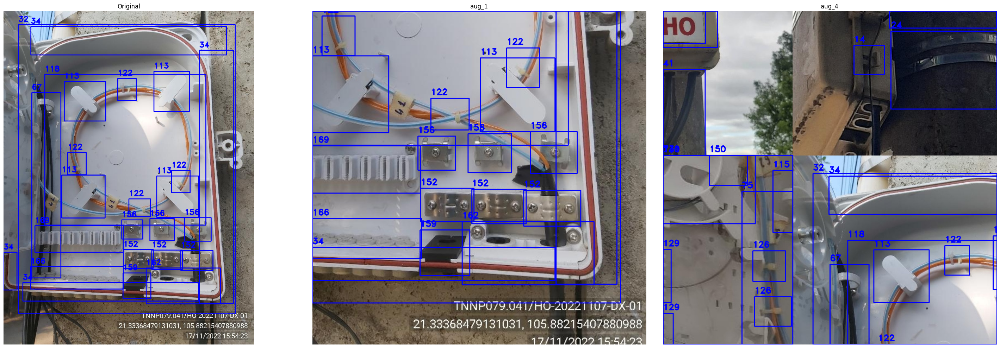

In [ ]:
visualize(
    aug_4_train_ids[0].stem,
     [local_paths['image_label_P40_dir'],
      local_paths['image_label_P40_aug_1_dir'],
      local_paths['image_label_P40_aug_2_dir'],
      local_paths['image_label_P40_aug_3_dir'],
      local_paths['image_label_P40_aug_4_dir']])

In [ ]:
len(set(aug_4_train_ids))

7356

In [ ]:
aug_4_train_images = [Path(local_paths['image_label_P40_aug_4_dir'], f) for f in Path.iterdir(local_paths['image_label_P40_aug_4_dir']) if f.suffix == '.jpg']
len(aug_4_train_images)

5151

In [ ]:
count=0
for f in Path.iterdir(local_paths['image_label_P40_aug_4_dir']):
    count+=1
print(count)

10302


In [ ]:
aug_4_train_images = [Path(local_paths['image_label_P40_aug_4_dir'], f) for f in Path.iterdir(local_paths['image_label_P40_aug_4_dir']) if f.suffix == '.jpg']
aug_none_1_2_3_4_train_images = []
aug_none_1_2_3_4_train_images.extend(aug_none_train_images)
aug_none_1_2_3_4_train_images.extend(aug_1_train_images)
aug_none_1_2_3_4_train_images.extend(aug_2_train_images)
aug_none_1_2_3_4_train_images.extend(aug_3_train_images)
aug_none_1_2_3_4_train_images.extend(aug_4_train_images)
write_image_paths(aug_none_1_2_3_4_train_images, local_paths['train_paths_P40_aug_4'])
print(len(aug_none_train_images)+len(aug_1_train_images)+len(aug_2_train_images)+len(aug_3_train_images)+len(aug_4_train_images)==len(aug_none_1_2_3_4_train_images),
      len(aug_none_1_2_3_4_train_images))

True 19864


In [ ]:
yolo_data_cfg_P40_aug_4 = {
    'train': str(local_paths['train_paths_P40_aug_4']),
    'val': str(local_paths['val_paths_P40']),
    'test': str(local_paths['test_paths_P40']),
    'nc': len(class_names_P40),
    'names': class_names_P40
}

with open(local_paths['yolo_data_cfg_P40_aug_4'], 'w') as f:
    yaml.dump(yolo_data_cfg_P40_aug_4, f, default_flow_style=False, sort_keys=False)

In [ ]:
with open('/content/dataset_v2_ALL/train_P40_aug_4.txt', 'r') as f:
    lines = f.readlines()
count = 0
for line in [line.strip() for line in lines]:
    if not Path(line).exists():
        print(line)
        count += 1
print(count)

0


# figures

## dataset

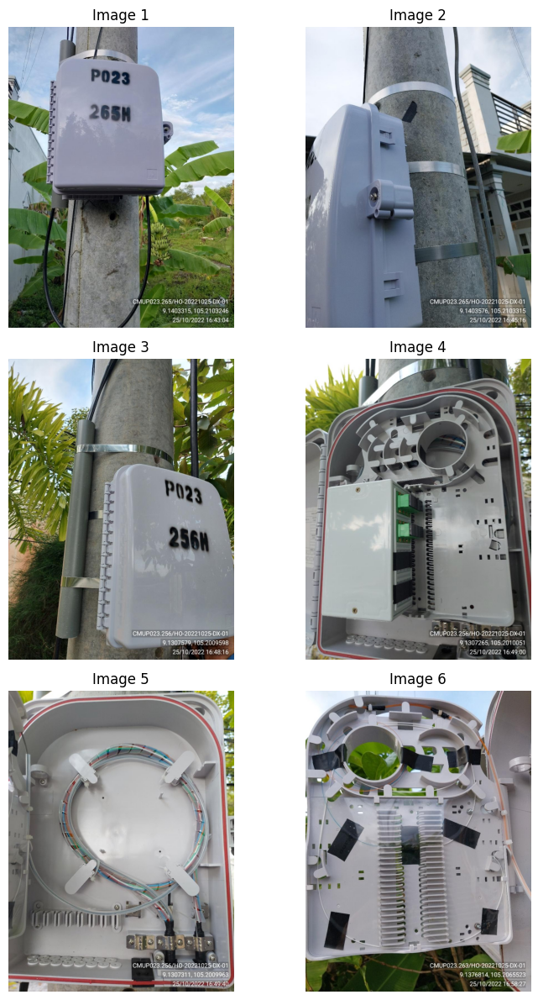

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

# List of image file paths (replace with your actual image paths)
image_files = [
    '2022_10_25_16_43_07-CMUP023265HO.jpg', '2022_10_25_16_45_18-CMUP023265HO.jpg',
    '2022_10_25_16_48_19-CMUP023256HO.jpg', '2022_10_25_16_49_03-CMUP023256HO.jpg',
    '2022_10_25_16_49_42-CMUP023256HO.jpg', '2022_10_25_16_58_29-CMUP023263HO.jpg'
    ]

# Create a figure with a 2x3 grid of subplots
fig, axes = plt.subplots(3, 2, figsize=(8, 12))

# Flatten the axes array for easier iteration
axes = axes.ravel()

# Load and display each image
for i in range(6):
    try:
        # Read the image
        img = mpimg.imread(Path(local_paths['image_label_dir'], image_files[i]))
        # Display the image on the corresponding subplot
        axes[i].imshow(img)
        axes[i].axis('off')  # Hide axes
        axes[i].set_title(f'Image {i+1}')  # Optional: Add title
    except FileNotFoundError:
        print(f"Image file {image_files[i]} not found. Please check the file path.")
        axes[i].axis('off')  # Hide empty subplot

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [ ]:
# Ensure columns are numeric
df_pivot_images_P00['train'] = df_pivot_images_P00['train'].astype(float)
df_pivot_images_P00['val'] = df_pivot_images_P00['val'].astype(float)
df_pivot_images_P00['test'] = df_pivot_images_P00['test'].astype(float)

# Calculate total and avoid division by zero
total = df_pivot_images_P00['train'] + df_pivot_images_P00['val'] + df_pivot_images_P00['test']
df_pivot_images_P00['train/all'] = df_pivot_images_P00['train'].div(total.where(total != 0, 1)).fillna(0)
df_pivot_images_P00['val/all'] = df_pivot_images_P00['val'].div(total.where(total != 0, 1)).fillna(0)
df_pivot_images_P00['test/all'] = df_pivot_images_P00['test'].div(total.where(total != 0, 1)).fillna(0)

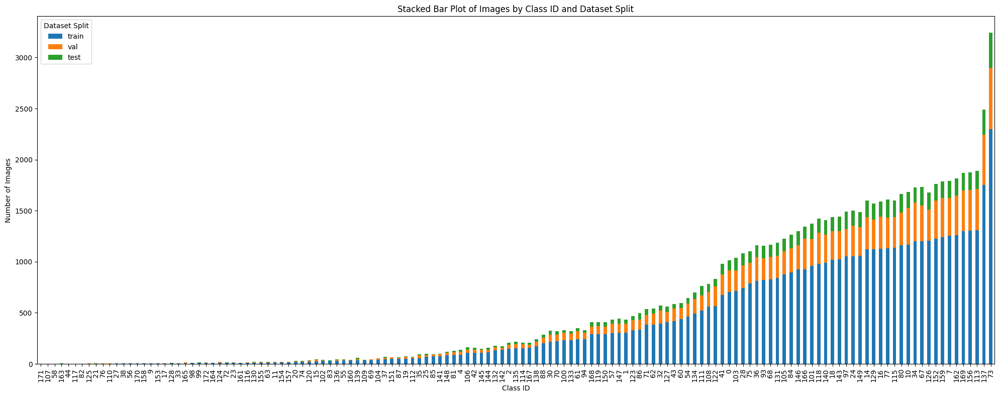

In [ ]:
df_pivot_images_P00 = df_investigate_split_P00.pivot_table(index='class_id', columns='set', values='# images')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_images_P00.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Images')
plt.title('Stacked Bar Plot of Images by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

In [ ]:
df_pivot_images_P00.to_csv('df_pivot_images_P00.csv')

In [ ]:
df_pivot_images_P00.describe()

set,train,val,test,train/all,val/all,test/all
count,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000
mean,396.834532,111.791367,56.258993,0.704337,0.189824,0.105839
std,480.101991,136.508612,68.550557,0.111447,0.102602,0.071054
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,14.500000,4.500000,3.000000,0.688106,0.172478,0.087177
50%,152.000000,39.000000,21.000000,0.707265,0.194425,0.098857
75%,799.500000,215.500000,118.000000,0.730944,0.211966,0.112823
max,2298.000000,599.000000,345.000000,1.000000,1.000000,0.500000


In [ ]:
55160.0/(55160.0+15539+7820)

0.7025051261478114

In [ ]:
df_investigate_all_P00.sum()


,0
class_id,13118
class_name,1.01.11.21.72.02.33.03.15.05.16.06.17.07.17.27...
# images,78519
# instances,117691


In [ ]:
len(all_images_P00)

10556

### Split dataset & save dataset division

In [ ]:
new_all_images_P00_aaa = all_images_P00.copy()
train_images_aaa = []
val_images_aaa = []
test_images_aaa = []
train_images_aaa, temp_images_aaa = train_test_split(new_all_images_P00_aaa, train_size=0.7, shuffle=False)
val_images_aaa, test_images_aaa = train_test_split(new_all_images_P00_aaa, train_size=2/3, shuffle=False)

In [ ]:
print(len(train_images_aaa))

7389


In [ ]:
write_image_paths(train_images_aaa, '/content/train_aaa.txt')
write_image_paths(val_images_aaa, '/content/val_aaa.txt')
write_image_paths(test_images_aaa, '/content/test_aaa.txt')

In [ ]:
investigate_train_P00_aaa, _ = investigate_set('/content/train_aaa.txt', class_ids_P00)
investigate_val_P00_aaa, _ = investigate_set('/content/val_aaa.txt', class_ids_P00)
investigate_test_P00_aaa, _ = investigate_set('/content/test_aaa.txt', class_ids_P00)

In [ ]:
df_investigate_train_P00_aaa = investigation_dict2df(investigate_train_P00_aaa)
df_investigate_val_P00_aaa = investigation_dict2df(investigate_val_P00_aaa)
df_investigate_test_P00_aaa = investigation_dict2df(investigate_test_P00_aaa)

139
139
139


In [ ]:
df_investigate_train_P00_aaa['set'] = 'train'
df_investigate_val_P00_aaa['set'] = 'val'
df_investigate_test_P00_aaa['set'] = 'test'

In [ ]:
df_investigate_split_P00_aaa = pd.concat([df_investigate_train_P00_aaa, df_investigate_val_P00_aaa, df_investigate_test_P00_aaa], axis=0, ignore_index=True)
df_investigate_split_P00_aaa

,class_id,class_name,# images,# instances,set
0,0,1.0,680,682,train
1,1,1.1,306,307,train
2,2,1.2,197,198,train
3,4,1.7,104,106,train
4,7,2.0,1278,1291,train
...,...,...,...,...,...
412,168,60.3,135,164,test
413,169,61.0,677,677,test
414,170,61.1,0,0,test
415,171,61.2,0,0,test


In [ ]:
df_investigate_split_P00.to_csv('/content/dataset_v2_ALL/split_P00.csv')

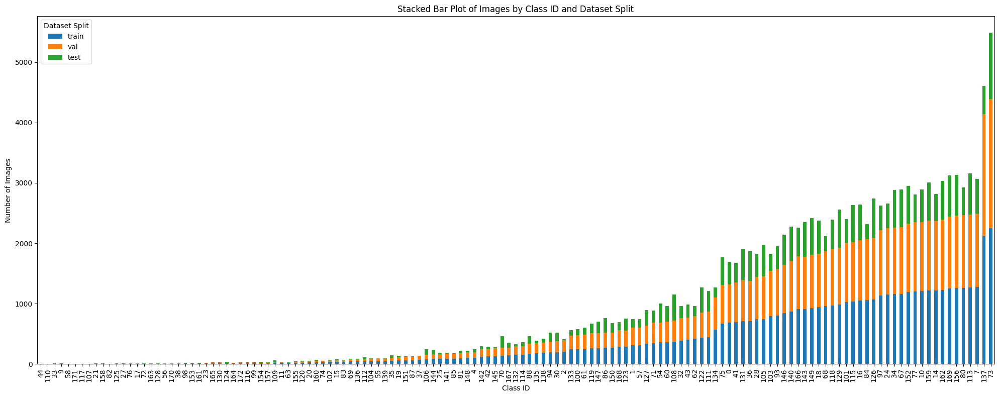

In [ ]:
df_pivot_images_P00_aaa = df_investigate_split_P00_aaa.pivot_table(index='class_id', columns='set', values='# images')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_images_P00_aaa.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Images')
plt.title('Stacked Bar Plot of Images by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

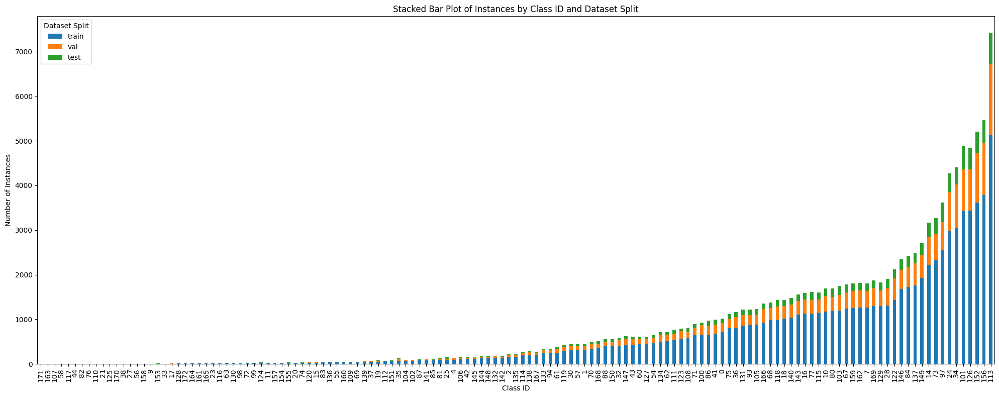

In [ ]:
df_pivot_instances_P00 = df_investigate_split_P00.pivot_table(index='class_id', columns='set', values='# instances')[['train', 'val', 'test']]

# Create a stacked bar plot
df_pivot_instances_P00.sort_values(by='train').plot(kind='bar', stacked=True, figsize=(20, 8))

plt.xlabel('Class ID')
plt.ylabel('Number of Instances')
plt.title('Stacked Bar Plot of Instances by Class ID and Dataset Split')
plt.legend(title='Dataset Split')
plt.tight_layout()

In [ ]:
# Ensure columns are numeric
df_pivot_images_P00_aaa['train'] = df_pivot_images_P00_aaa['train'].astype(float)
df_pivot_images_P00_aaa['val'] = df_pivot_images_P00_aaa['val'].astype(float)
df_pivot_images_P00_aaa['test'] = df_pivot_images_P00_aaa['test'].astype(float)

# Calculate total and avoid division by zero
total_aaa = df_pivot_images_P00_aaa['train'] + df_pivot_images_P00_aaa['val'] + df_pivot_images_P00_aaa['test']
df_pivot_images_P00_aaa['train/all'] = df_pivot_images_P00_aaa['train'].div(total_aaa.where(total_aaa != 0, 1)).fillna(0)
df_pivot_images_P00_aaa['val/all'] = df_pivot_images_P00_aaa['val'].div(total_aaa.where(total_aaa != 0, 1)).fillna(0)
df_pivot_images_P00_aaa['test/all'] = df_pivot_images_P00_aaa['test'].div(total_aaa.where(total_aaa != 0, 1)).fillna(0)

In [ ]:
df_pivot_images_P00_aaa

set,train,val,test,train/all,val/all,test/all
class_id,,,,,,
0,680.0,639.0,374.0,0.401654,0.377437,0.220910
1,306.0,295.0,139.0,0.413514,0.398649,0.187838
2,197.0,193.0,16.0,0.485222,0.475369,0.039409
4,104.0,91.0,46.0,0.431535,0.377593,0.190871
7,1278.0,1211.0,581.0,0.416287,0.394463,0.189251
...,...,...,...,...,...,...
168,284.0,272.0,135.0,0.410999,0.393632,0.195369
169,1250.0,1194.0,677.0,0.400513,0.382570,0.216918
170,4.0,4.0,0.0,0.500000,0.500000,0.000000


In [ ]:
df_pivot_images_P00_aaa.describe()

set,train,val,test,train/all,val/all,test/all
count,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000
mean,386.122302,368.079137,196.805755,0.399637,0.379335,0.221027
std,480.085008,457.794446,237.365336,0.066014,0.071967,0.135191
min,1.000000,1.000000,0.000000,0.142857,0.142857,0.000000
25%,14.500000,14.000000,7.000000,0.373705,0.357539,0.142857
50%,147.000000,142.000000,69.000000,0.404659,0.384163,0.208652
75%,726.500000,690.000000,389.000000,0.438297,0.416667,0.268588
max,2246.000000,2146.000000,1096.000000,0.500000,0.500000,0.714286


## else

In [ ]:
{41, 42, 43, 54, 60, 61, 62}

In [ ]:
investigate_all_P40[41][0][0]

'2022_10_25_16_19_05-HNIP129291HO'

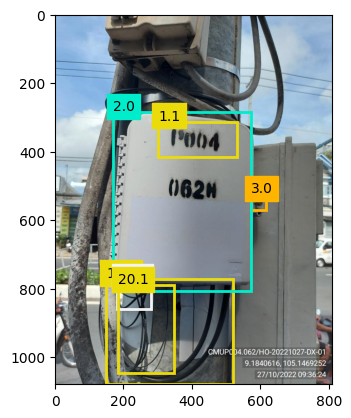

In [ ]:
from ultralytics.data.utils import visualize_image_annotations
class_names_P40_map = {k:v for k,v in enumerate(class_names_P40)}
# Visualize
idtest = investigate_all_P40[41][0][2]
visualize_image_annotations(
    f"/content/dataset_v2_ALL/image_label_P40/{idtest}.jpg",  # Input image path.
    f"/content/dataset_v2_ALL/image_label_P40/{idtest}.txt",  # Annotation file path for the image.
    class_names_P40_map,
)

[]


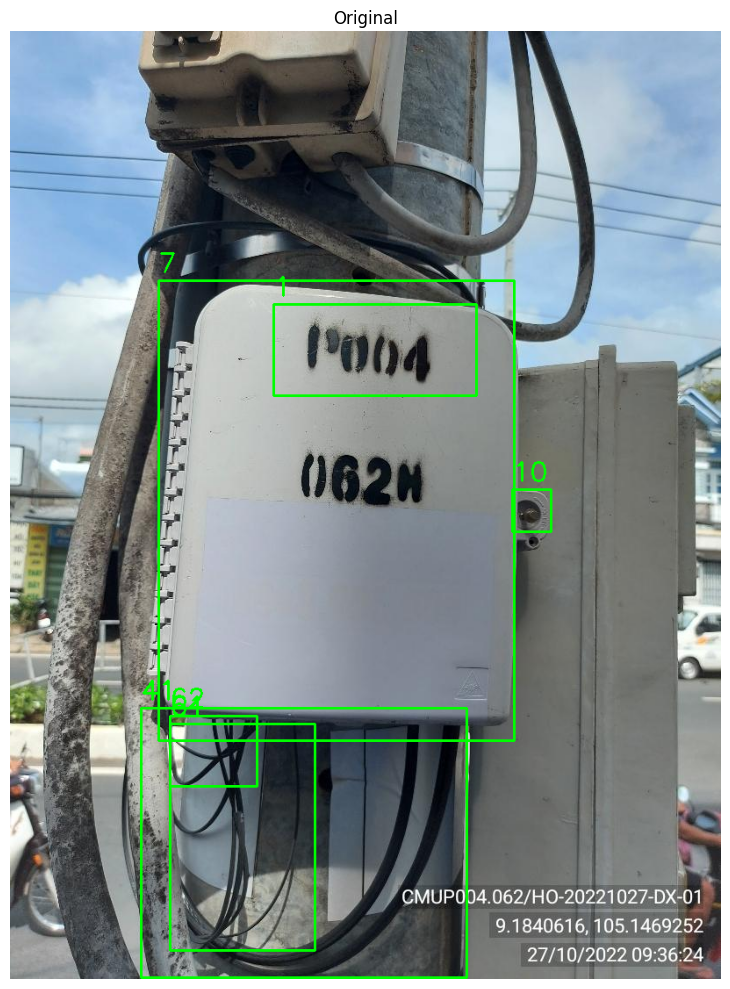

In [ ]:
visualize(
    investigate_all_P40[41][0][2],
     [local_paths['image_label_P40_dir'],
      local_paths['image_label_P40_aug_1_dir'],
      local_paths['image_label_P40_aug_2_dir'],
      local_paths['image_label_P40_aug_3_dir'],
      local_paths['image_label_P40_aug_4_dir']])

In [ ]:
investigate_all_P40

{0: [['2022_10_25_16_19_05-HNIP129291HO',
   '2022_10_26_16_16_21-BTNP030951HO',
   '2022_10_27_09_21_55-BTNP051635HO',
   '2022_10_27_10_27_19-BTNP051625HO',
   '2022_10_27_10_39_22-BTNP051626HO',
   '2022_10_27_10_45_18-BTNP030887HO',
   '2022_10_27_10_47_10-TQGP002092HO',
   '2022_10_27_10_58_32-BTNP031916HO',
   '2022_10_27_12_14_17-TQGP008255HO',
   '2022_10_27_14_12_41-DNIP010581HO',
   '2022_10_27_14_19_33-DNIP010582HO',
   '2022_10_27_14_35_50-CMUP004074HO',
   '2022_10_27_15_01_21-BTNP035714HO',
   '2022_10_27_15_10_32-DNIP010527HO',
   '2022_10_27_15_24_25-BTNP035710HO',
   '2022_10_27_15_29_38-BTNP032512HO',
   '2022_10_27_15_39_04-BTNP047321HO',
   '2022_10_27_15_46_42-BTNP046712HO',
   '2022_10_27_16_03_39-BTNP032503HO',
   '2022_10_27_16_15_58-DNIP010523HO',
   '2022_10_27_16_26_28-BTNP051615HO',
   '2022_10_27_16_29_16-DNIP010522HO',
   '2022_10_27_16_41_16-DNIP010531HO',
   '2022_10_28_09_12_09-BTNP046708HO',
   '2022_10_28_09_17_16-BTNP051250HO',
   '2022_10_28_09_24_0